In [1]:
print("importing modules")
import os
import sys
import json
import argparse
import numpy as np
import time
import random
import string
import h5py
from tqdm import tqdm
import webdataset as wds
from PIL import Image
import pandas as pd
import nibabel as nib
import nilearn

import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torchvision import transforms

# tf32 data type is faster than standard float32
torch.backends.cuda.matmul.allow_tf32 = True

import utils
from utils import load_preprocess_betas, resample, applyxfm, apply_thresh, resample_betas

# this block imports utils from mindeye_preproc as "preproc"
import importlib.util
parent_utils_path = "/scratch/am10150/projects/mindeye_preproc/analysis/utils.py"
spec = importlib.util.spec_from_file_location("utils", parent_utils_path)
preproc = importlib.util.module_from_spec(spec)
parent_dir = os.path.dirname(parent_utils_path)
if parent_dir not in sys.path:
    sys.path.append(parent_dir)
spec.loader.exec_module(preproc)

if utils.is_interactive():
    from IPython.display import clear_output # function to clear print outputs in cell
    %load_ext autoreload 
    # this allows you to change functions in models.py or utils.py and have this notebook automatically update with your revisions
    %autoreload 2 

importing modules


In [2]:
from accelerate import Accelerator, DeepSpeedPlugin
from generative_models.sgm.models.diffusion import DiffusionEngine
from omegaconf import OmegaConf

import os
### Multi-GPU config ###
local_rank = os.getenv('RANK')
if local_rank is None: 
    local_rank = 0
else:
    local_rank = int(local_rank)
print("LOCAL RANK ", local_rank)  

accelerator = Accelerator(split_batches=False, mixed_precision="fp16")
device = accelerator.device
print("device:",device)

/scratch/am10150/projects/rtcloud-projects/mindeye/conf/.venv/lib64/python3.11/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


LOCAL RANK  0
device: cuda


# Data

## New Design

In [3]:
if utils.is_interactive():
    sub = "sub-005"
    session = "ses-03"
    task = 'C'  # 'study' or 'A'; used to search for functional run in bids format
else:
    sub = os.environ["sub"]
    session = os.environ["session"]
    task = os.environ["task"]

if session == "all":
    ses_list = ["ses-01", "ses-02"]  # list of actual session IDs
    design_ses_list = ["ses-01", "ses-02"]  # list of session IDs to search for design matrix
else:
    ses_list = [session]
    design_ses_list = [session]
    
task_name = f"_task-{task}" if task != 'study' else ''
resample_voxel_size = False
resample_post_glmsingle = False  # do you want to do voxel resampling here? if resample_voxel_size = True and resample_post_glmsingle = False, assume the resampling has been done prior to GLMsingle, so just use resampled directory but otherwise proceed as normal
load_from_resampled_file = False  # do you want to load resampled data from file? if True, assume resampling was done in this notebook before, and that we're not using the GLMsingle resampled data
    
train_test_split = 'repeats_3' # 'MST', 'orig', 'unique', 'repeats_3'
remove_close_to_MST = False
remove_random_n = False

if remove_close_to_MST or remove_random_n:
    assert remove_close_to_MST != remove_random_n  # don't remove both sets of images

n_to_remove = 0
if remove_random_n:
    assert train_test_split == 'MST'  # MST images are excluded from the n images removed, so only makes sense if they're not in the training set
    n_to_remove = 150
    
if resample_voxel_size:
    # voxel size was unchanged in glmsingle, want to perform resampling here
    resampled_vox_size = 2.5
    resample_method = "sinc"  # {trilinear,nearestneighbour,sinc,spline}, credit: https://johnmuschelli.com/fslr/reference/flirt.help.html
    
    # file name helper variables
    vox_dim_str = str(resampled_vox_size).replace('.', '_')  # in case the voxel size has a decimal, replace with an underscore
    resampled_suffix = f"resampled_{vox_dim_str}mm_{resample_method}"
    mask_resampled_suffix = resampled_suffix
    if resample_post_glmsingle:
        resampled_suffix += '_postglmsingle'
    else:
        resampled_suffix += '_preglmsingle'

In [4]:
session_label = preproc.get_session_label(ses_list)
print('session label:', session_label)
n_runs, _ = preproc.get_runs_per_session(sub, session, ses_list)

session label: ses-03


In [5]:
# if running this interactively, can specify jupyter_args here for argparser to use
if utils.is_interactive():
    model_name="sub-005_ses-01_task-C_bs24_MST_rishab_repeats_3split_1_avgrepeats_finalmask_epochs{NUM_EPOCHS}"
    # model_name="testing_MST"
    print("model_name:", model_name)
    glmsingle_path=f"/scratch/am10150/projects/mindeye_preproc/glmsingle/glmsingle_{sub}_{session}_task-{task}"
    print("glmsingle_path:", glmsingle_path)
    eval_dir = f"/scratch/am10150/projects/MindEyeV2/src/mindeyev2/evals/{model_name}"
    print(eval_dir)
    assert os.path.exists(eval_dir)
    assert os.path.exists(glmsingle_path)
    
    # global_batch_size and batch_size should already be defined in the above cells
    # other variables can be specified in the following string:
    jupyter_args = f"--data_path=/scratch/am10150/projects/MindEyeV2/src/mindeyev2_data \
                    --model_name={model_name} --subj=1 \
                    --glmsingle_path={glmsingle_path} \
                    --eval_dir={eval_dir} \
                    --no-blurry_recon --use_prior \
                    --hidden_dim=1024 --n_blocks=4"
    
    print(jupyter_args)
    jupyter_args = jupyter_args.split()
    
    from IPython.display import clear_output # function to clear print outputs in cell
    %load_ext autoreload 
    # this allows you to change functions in models.py or utils.py and have this notebook automatically update with your revisions
    %autoreload 2 

model_name: sub-005_ses-01_task-C_bs24_MST_rishab_repeats_3split_1_avgrepeats_finalmask_epochs{NUM_EPOCHS}
glmsingle_path: /scratch/am10150/projects/mindeye_preproc/glmsingle/glmsingle_sub-005_ses-03_task-C
/scratch/am10150/projects/MindEyeV2/src/mindeyev2/evals/sub-005_ses-01_task-C_bs24_MST_rishab_repeats_3split_1_avgrepeats_finalmask_epochs{NUM_EPOCHS}
--data_path=/scratch/am10150/projects/MindEyeV2/src/mindeyev2_data                     --model_name=sub-005_ses-01_task-C_bs24_MST_rishab_repeats_3split_1_avgrepeats_finalmask_epochs{NUM_EPOCHS} --subj=1                     --glmsingle_path=/scratch/am10150/projects/mindeye_preproc/glmsingle/glmsingle_sub-005_ses-03_task-C                     --eval_dir=/scratch/am10150/projects/MindEyeV2/src/mindeyev2/evals/sub-005_ses-01_task-C_bs24_MST_rishab_repeats_3split_1_avgrepeats_finalmask_epochs{NUM_EPOCHS}                     --no-blurry_recon --use_prior                     --hidden_dim=1024 --n_blocks=4
The autoreload extension is alread

In [6]:
parser = argparse.ArgumentParser(description="Model Training Configuration")
parser.add_argument(
    "--model_name", type=str, default="testing",
    help="will load ckpt for model found in ../train_logs/model_name",
)
parser.add_argument(
    "--data_path", type=str, default="/weka/proj-fmri/shared/mindeyev2_dataset",
    help="Path to where NSD data is stored / where to download it to",
)
parser.add_argument(
    "--subj",type=int, default=1, choices=[1,2,3,4,5,6,7,8],
    help="Validate on which subject?",
)
parser.add_argument(
    "--blurry_recon",action=argparse.BooleanOptionalAction,default=True,
)
parser.add_argument(
    "--use_prior",action=argparse.BooleanOptionalAction,default=False,
    help="whether to train diffusion prior (True) or just rely on retrieval part of the pipeline (False)",
)
parser.add_argument(
    "--clip_scale",type=float,default=1.,
)
parser.add_argument(
    "--n_blocks",type=int,default=4,
)
parser.add_argument(
    "--hidden_dim",type=int,default=2048,
)
parser.add_argument(
    "--new_test",action=argparse.BooleanOptionalAction,default=True,
)
parser.add_argument(
    "--seq_len",type=int,default=1,
)
parser.add_argument(
    "--seed",type=int,default=42,
)
parser.add_argument(
    "--glmsingle_path",type=str,default="/scratch/gpfs/ri4541/MindEyeV2/src/mindeyev2/glmsingle_ses-01",
)
parser.add_argument(
    "--eval_dir",type=str,default="/scratch/gpfs/ri4541/MindEyeV2/src/mindeyev2/evals/",
)

if utils.is_interactive():
    args = parser.parse_args(jupyter_args)
else:
    args = parser.parse_args()

# create global variables without the args prefix
for attribute_name in vars(args).keys():
    globals()[attribute_name] = getattr(args, attribute_name)
    
# make output directory
# os.makedirs("evals",exist_ok=True)
# os.makedirs(f"evals/{model_name}",exist_ok=True)

In [7]:
if session == "all":
    filename = f"csv/{sub}_{ses_list[0]}.csv"
    data = pd.read_csv(filename)[14:]
    print(filename)
    print(data.shape)
    for s in ses_list[1:]:
        filename = f"csv/{sub}_{s}.csv"
        print(filename)
        data = pd.concat([data, pd.read_csv(filename)[14:]])
        print(data.shape)
else:
    filename = f"csv/{sub}_{session}.csv"
    if sub == 'sub-001' and session == 'ses-01':
        data = pd.read_csv(filename)[23:]
    else: 
        data = pd.read_csv(filename)[14:]
    print(filename)
    print(data.shape)

image_names = data['current_image'].values
starts = data['trial.started'].values
is_new_run = data['is_new_run'].values

if sub == 'sub-001':
    if session == 'ses-01':
        assert image_names[0] == 'images/image_686_seed_1.png'
    elif session in ('ses-02', 'all'):
        assert image_names[0] == 'all_stimuli/special515/special_40840.jpg'
    elif session == 'ses-03':
        assert image_names[0] == 'all_stimuli/special515/special_69839.jpg'
    elif session == 'ses-04':
        assert image_names[0] == 'all_stimuli/rtmindeye_stimuli/image_686_seed_1.png'
elif sub == 'sub-003':
    assert image_names[0] == 'all_stimuli/rtmindeye_stimuli/image_686_seed_1.png'

unique_images = np.unique(image_names.astype(str))
unique_images = unique_images[(unique_images!="nan")]
# unique_images = unique_images[(unique_images!="blank.jpg")]
len_unique_images = len(unique_images)
print("len_unique_images",len_unique_images)
print("n_runs",n_runs)

if (sub == 'sub-001' and session == 'ses-04') or (sub == 'sub-003' and session == 'ses-01'):
    assert len(unique_images) == 851

print(image_names[:4])
print(starts[:4])
print(is_new_run[:4])

if remove_random_n:
    # want to remove 150 imgs
    # 100 special515 imgs are repeated 3x (300 total)
    # all other train imgs are only shown once (558 total)
    # of the 150, want to sample proportionally since we're cutting all repeats for special515
    # so take out 51 (17 unique) from special515 and 99 from rest = removing 150 total
    np.random.seed(seed)
    options_to_remove = [x for x in set(image_names) if str(x) != 'nan' and x != 'blank.jpg' and 'MST_pairs' not in x and 'special515' not in x and list(image_names).count(x)==1]  # all the imgs that only appear once (this is O(N^2) b/c of count() within list comprehension but image_names is a relatively small list)
    options_to_remove_special515 = [x for x in set(image_names) if str(x) != 'nan' and x != 'blank.jpg' and 'MST_pairs' not in x and 'special515' in x and list(image_names).count(x)>1]  # all the special515 images that are repeated (count()>1 necessary because there are special515 that are not repeated)
    imgs_to_remove = np.random.choice(options_to_remove, size=99, replace=False)
    imgs_to_remove = np.append(imgs_to_remove, np.random.choice(options_to_remove_special515, size=17, replace=False))

image_idx = np.array([])  # contains the unique index of each presented image
vox_image_names = np.array([])  # contains the names of the images corresponding to image_idx
all_MST_images = dict()
for i, im in enumerate(image_names):
    # skip if blank, nan
    if im == "blank.jpg":
        i+=1
        continue
    if str(im) == "nan":
        i+=1
        continue
    vox_image_names = np.append(vox_image_names, im)
    if remove_close_to_MST:  # optionally skip close_to_MST images 
        if "closest_pairs" in im:
            i+=1
            continue
    elif remove_random_n:
        if im in imgs_to_remove:
            i+=1
            continue
            
    image_idx_ = np.where(im==unique_images)[0].item()
    image_idx = np.append(image_idx, image_idx_)
    
    if (sub == 'sub-001' and session == 'ses-04') or (sub == 'sub-003' and session == 'ses-01'):  # MST images are ones that matched these image titles
        import re
        if ('w_' in im or 'paired_image_' in im or re.match(r'all_stimuli/rtmindeye_stimuli/\d{1,2}_\d{1,3}\.png$', im) or re.match(r'images/\d{1,2}_\d{1,3}\.png$', im)):  
        # the regexp here looks for **_***.png, allows 1-2 chars before underscore and 1-3 chars after it
            # print(im)
            all_MST_images[i] = im
            i+=1            
    elif 'MST' in im:
        all_MST_images[i] = im
        i+=1
    
image_idx = torch.Tensor(image_idx).long()
# for im in new_image_names[MST_images]:
#     assert 'MST_pairs' in im
# assert len(all_MST_images) == 300

unique_MST_images = np.unique(list(all_MST_images.values())) 

MST_ID = np.array([], dtype=int)
if remove_close_to_MST:
    close_to_MST_idx = np.array([], dtype=int)
if remove_random_n:
    random_n_idx = np.array([], dtype=int)

vox_idx = np.array([], dtype=int)
j=0  # this is a counter keeping track of the remove_random_n used later to index vox based on the removed images; unused otherwise
for i, im in enumerate(image_names):  # need unique_MST_images to be defined, so repeating the same loop structure
    # skip if blank, nan
    if im == "blank.jpg":
        i+=1
        continue
    if str(im) == "nan":
        i+=1
        continue
    if remove_close_to_MST:  # optionally skip close_to_MST images 
        if "closest_pairs" in im:
            close_to_MST_idx = np.append(close_to_MST_idx, i)
            i+=1
            continue
    if remove_random_n:
        if im in imgs_to_remove:
            vox_idx = np.append(vox_idx, j)
            i+=1
            j+=1
            continue
    j+=1
    curr = np.where(im == unique_MST_images)
    # print(curr)
    if curr[0].size == 0:
        MST_ID = np.append(MST_ID, np.array(len(unique_MST_images)))  # add a value that should be out of range based on the for loop, will index it out later
    else:
        MST_ID = np.append(MST_ID, curr)
        
assert len(MST_ID) == len(image_idx)
# assert len(np.argwhere(pd.isna(data['current_image']))) + len(np.argwhere(data['current_image'] == 'blank.jpg')) + len(image_idx) == len(data)
# MST_ID = torch.tensor(MST_ID[MST_ID != len(unique_MST_images)], dtype=torch.uint8)  # torch.tensor (lowercase) allows dtype kwarg, Tensor (uppercase) is an alias for torch.FloatTensor
print(MST_ID.shape)
if (sub == 'sub-001' and session == 'ses-04') or (sub == 'sub-003' and session == 'ses-01'):
    assert len(all_MST_images) == 100

csv/sub-005_ses-03.csv
(785, 126)
len_unique_images 532
n_runs 11
['all_stimuli/unchosen_nsd_1000_images/unchosen_7211_cocoid_59250.png'
 'all_stimuli/special515/special_67295.jpg'
 'all_stimuli/unchosen_nsd_1000_images/unchosen_5729_cocoid_53029.png'
 'all_stimuli/special515/special_70232.jpg']
[174.7109683 178.7049172 182.7072832 186.7297016]
[0. 0. 0. 0.]
(693,)


In [8]:
# unique_images_pairs = [
#     (1,2),(3,4),(5,6),(7,8),(9,10),(11,12),(13,14),(15,16),
#     (17,18),(19,20),(21,22),(23,24),(25,26),(27,28),(29,30),
#     (31,32),(33,34),(35,36),
#     (787, 788), (789, 790), (791, 792), (793, 794), (795, 796),
#     (797, 798), (799, 800), (801, 802), (803, 804), (805, 806),
#     (807, 808), (809, 810), (811, 812), (813, 814), (815, 816),
#     (817, 818), (819, 820), (821, 822), (823, 824), (825, 826),
#     (827, 828), (829, 830), (831, 832), (833, 834), (835, 836),
#     (837, 838), (839, 840), (841, 842), (843, 844), (845, 846),
#     (847, 848), (849, 850)
# ]
# unique_images[unique_images_pairs]

In [9]:
import imageio.v2 as imageio
resize_transform = transforms.Resize((224, 224))
MST_images = []
images = None
for im_name in tqdm(image_idx):
    if sub == 'sub-001' and session == 'ses-01':
        image_file = f"all_stimuli/rtmindeye_stimuli/{unique_images[im_name]}"
    else:
        image_file = f"{unique_images[im_name]}"
    im = imageio.imread(image_file)
    im = torch.Tensor(im / 255).permute(2,0,1)
    im = resize_transform(im.unsqueeze(0))
    if images is None:
        images = im
    else:
        images = torch.vstack((images, im))
    if (sub == 'sub-001' and session == 'ses-04') or (sub == 'sub-003' and session == 'ses-01'):
        if ('w_' in image_file or 'paired_image_' in image_file or re.match(r'all_stimuli/rtmindeye_stimuli/\d{1,2}_\d{1,3}\.png$', image_file) or re.match(r'all_stimuli/rtmindeye_stimuli/images/\d{1,2}_\d{1,3}\.png$', image_file)):  
            MST_images.append(True)
        else:
            MST_images.append(False)
    else:   
        if ("MST_pairs" in image_file): # ("_seed_" not in unique_images[im_name]) and (unique_images[im_name] != "blank.jpg") 
            MST_images.append(True)
        else:
            MST_images.append(False)

print("images", images.shape)
MST_images = np.array(MST_images)
print("MST_images", len(MST_images))
if (sub == 'sub-001' and session == 'ses-04') or (sub == 'sub-003' and session == 'ses-01'):
    assert len(MST_images[MST_images==True]) == 100
print("MST_images==True", len(MST_images[MST_images==True]))

  0%|▏                                                                                                                                                             | 1/693 [00:00<02:25,  4.75it/s]/scratch/am10150/projects/rtcloud-projects/mindeye/conf/.venv/lib64/python3.11/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
  1%|█▎                              

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 693/693 [01:03<00:00, 10.97it/s]

images torch.Size([693, 3, 224, 224])
MST_images 693
MST_images==True 124


In [10]:
pairs = utils.find_paired_indices(image_idx)
pairs = sorted(pairs, key=lambda x: x[0])

In [11]:
vox = None
needs_postprocessing = False
params = (session, ses_list, remove_close_to_MST, image_names, remove_random_n, vox_idx)

if resample_post_glmsingle == True:
    glm_save_path_resampled = f"{glmsingle_path}/vox_resampled.nii.gz"
    if load_from_resampled_file == True:
        # resampling was done in this notebook so we can load from file
        vox = nib.load(glm_save_path_resampled)
    else:
        # do resampling here
        assert os.path.exists(ref_name) and os.path.exists(omat_name), "need to generate the boldref and omat separately since we don't have access to the functional data here; either do so using flirt on the command line or copy over the glmsingle resampled outputs"
        vox = load_preprocess_betas(orig_glmsingle_path, *params)
        vox = resample_betas(orig_glmsingle_path, sub, session, task_name, vox, glmsingle_path, glm_save_path_resampled, ref_name, omat_name)
    needs_postprocessing = True

if vox is None:
    # either resampling was done in glmsingle or we aren't resampling 
    vox = load_preprocess_betas(glmsingle_path, *params)

if needs_postprocessing == True:
    vox = apply_mask(vox, avg_mask)
    vox = vox.reshape(-1, vox.shape[-1])  # flatten the 3D image into np array with shape (voxels, images)
    print(vox.shape)


vox (693, 1, 1, 183408)
vox (693, 183408)


In [12]:
from nilearn.plotting import plot_roi, plot_anat, plot_epi

mask_name = f'/scratch/am10150/projects/mindeye_preproc/glmsingle/glmsingle_{sub}_task-{task}/{sub}_final_brain'
if resample_voxel_size:
    if resample_post_glmsingle is True:
        # use original mask directory
        mask_in_name = f'{orig_glmsingle_path}/{sub}_{session}{task_name}_brain.nii.gz'
        mask_out_name = mask_name + f"_{mask_resampled_suffix}.nii.gz"
        assert os.path.exists(mask_in_name)
        applyxfm(mask_in_name, ref_name, omat_name, resample_method, output=mask_out_name)
        apply_thresh(mask_out_name, 0.5, output=mask_out_name)  # binarize the mask since resampling can result in non- 0 or 1 values
    mask_name += f"_{mask_resampled_suffix}"

mask_name += ".nii.gz"
print(mask_name)
avg_mask = nib.load(mask_name)
# mask info
dimsize=avg_mask.header.get_zooms()
affine_mat = avg_mask.affine
brain=avg_mask.get_fdata()
xyz=brain.shape #xyz dimensionality of brain mask and epi data

print('Mask dimensions:', dimsize)
print('')
print('Affine:')
print(affine_mat)
print('')
print(f'There are {int(np.sum(brain))} voxels in the included brain mask\n')

/scratch/am10150/projects/mindeye_preproc/glmsingle/glmsingle_sub-005_task-C/sub-005_final_brain.nii.gz
Mask dimensions: (2.0, 2.0, 2.0)

Affine:
[[  2.           0.           0.         -76.29234314]
 [  0.           2.           0.         -84.79180908]
 [  0.           0.           2.         -62.80359268]
 [  0.           0.           0.           1.        ]]

There are 180585 voxels in the included brain mask



In [13]:
if vox.shape[1] != int(avg_mask.get_fdata().sum()):
    # betas probably come from a session-specific mask that doesn't correspond to the intersection mask created during multi-session analysis
    # if so, try reshaping vox based on the session-specific mask
    print('vox doesn\'t match roi shape; reshaping to match multi-session final mask')
    session_mask = nib.load(f'{glmsingle_path}/{sub}_{session_label}{task_name}_brain.nii.gz')
    assert int(session_mask.get_fdata().sum()) == vox.shape[1], 'session mask doesn\'t correspond to glmsingle betas!'
    unmasked_vox = nilearn.masking.unmask(vox, session_mask)  # shape will be (X x Y x Z x images)
    vox = nilearn.masking.apply_mask(unmasked_vox, avg_mask)
    print(vox.shape)

vox doesn't match roi shape; reshaping to match multi-session final mask
(693, 180585)


In [14]:
# from nilearn.plotting import plot_roi, plot_anat, plot_epi

# mask_name = f'{glmsingle_path}/{sub}_{session_label}{task_name}_brain'
# if resample_voxel_size:
#     if resample_post_glmsingle is True:
#         # use original mask directory
#         mask_in_name = f'{orig_glmsingle_path}/{sub}_{session}{task_name}_brain.nii.gz'
#         mask_out_name = mask_name + f"_{mask_resampled_suffix}.nii.gz"
#         assert os.path.exists(mask_in_name)
#         applyxfm(mask_in_name, ref_name, omat_name, resample_method, output=mask_out_name)
#         apply_thresh(mask_out_name, 0.5, output=mask_out_name)  # binarize the mask since resampling can result in non- 0 or 1 values
#     mask_name += f"_{mask_resampled_suffix}"

# mask_name += ".nii.gz"
# print(mask_name)
# avg_mask = nib.load(mask_name)
# # mask info
# dimsize=avg_mask.header.get_zooms()
# affine_mat = avg_mask.affine
# brain=avg_mask.get_fdata()
# xyz=brain.shape #xyz dimensionality of brain mask and epi data


# if vox.shape[1] != int(avg_mask.get_fdata().sum()):
#     # betas probably come from a session-specific mask that doesn't correspond to the intersection mask created during multi-session analysis
#     # if so, try reshaping vox based on the session-specific mask
#     print('vox doesn\'t match roi shape; reshaping to match multi-session final mask')
#     session_label_to_use = 'ses-03'
#     session_mask = nib.load(f'{glmsingle_path}/{sub}_{session_label_to_use}{task_name}_brain.nii.gz')
#     assert int(session_mask.get_fdata().sum()) == vox.shape[1], 'session mask doesn\'t correspond to glmsingle betas!'
#     unmasked_vox = nilearn.masking.unmask(vox, session_mask)  # shape will be (X x Y x Z x images)
#     vox = nilearn.masking.apply_mask(unmasked_vox, avg_mask)
#     print(vox.shape)
    
# assert len(vox) == len(image_idx)

# print('Mask dimensions:', dimsize)
# print('')
# print('Affine:')
# print(affine_mat)
# print('')
# print(f'There are {int(np.sum(brain))} voxels in the included brain mask\n')

In [15]:
nsdgeneral_path = f'{glmsingle_path}/{sub}_{session_label}{task_name}_nsdgeneral.nii.gz'  
print(nsdgeneral_path)
assert os.path.exists(nsdgeneral_path)
print(f"nsdgeneral path exists!")

/scratch/am10150/projects/mindeye_preproc/glmsingle/glmsingle_sub-005_ses-03_task-C/sub-005_ses-03_task-C_nsdgeneral.nii.gz
nsdgeneral path exists!


In [16]:
if resample_voxel_size:
    nsdgeneral_path = f'{glmsingle_path}/{sub}_task-{task}_nsdgeneral_resampled.nii.gz'  
    if resample_post_glmsingle:
        assert os.path.exists(orig_glmsingle_path)
        roi_in_path = f"{orig_glmsingle_path}/{sub}_task-{task}_nsdgeneral.nii.gz"  # the input file is the original nsdgeneral mask (without resampling), from the original glmsingle directory
        applyxfm(roi_in_path, ref_name, omat_name, resample_method, output=nsdgeneral_path)

(76, 90, 74)


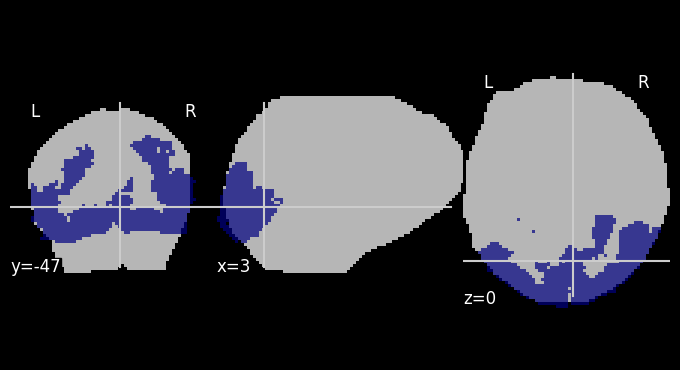

In [17]:
roi = nib.load(nsdgeneral_path)
print(roi.shape)
plot_roi(roi, bg_img=avg_mask)
plt.show()

In [18]:
avg_mask = avg_mask.get_fdata().flatten()
print(f"total voxels (whole brain) = {int(avg_mask.sum())}")

roi = roi.get_fdata()
roi = roi.flatten()
roi = roi[avg_mask.astype(bool)]
roi[np.isnan(roi)] = 0
roi = roi.astype(bool)
print(f"nsdgeneral voxels = {roi.sum()}")

total voxels (whole brain) = 180585
nsdgeneral voxels = 19174


In [19]:
# ROI masking?
print(f"vox before ROI exclusion: {vox.shape}")
vox = vox[:,roi]
print(f"vox after ROI exclusion: {vox.shape}")

if np.any(np.isnan(vox)):
    print("NaNs found! Removing voxels...")
    x,y = np.where(np.isnan(vox))
    vox = vox[:,np.setdiff1d(np.arange(vox.shape[-1]), y)]

vox before ROI exclusion: (693, 180585)
vox after ROI exclusion: (693, 19174)


In [20]:
pairs_homog = np.array([[p[0], p[1]] for p in pairs])

In [21]:
vox_pairs = utils.zscore(vox[pairs_homog])
rels = np.full(vox.shape[-1],np.nan)
for v in tqdm(range(vox.shape[-1])):
    rels[v] = np.corrcoef(vox_pairs[:,0,v], vox_pairs[:,1,v])[1,0]
print("rels", rels.shape)
assert np.sum(np.all(np.isnan(rels))) == 0

 26%|██████████████████████████████████████▉                                                                                                               | 4979/19174 [00:00<00:00, 24966.00it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19174/19174 [00:00<00:00, 24605.54it/s]

rels (19174,)


In [22]:
# creating img x vox x repetitions matrix | shape=(150, 18419, 2)
vox0 = np.zeros((len(pairs_homog), vox.shape[-1], 2))
print(vox0.shape)
for ipair, pair in enumerate(tqdm(pairs_homog)):
    pair = pair[:2] # to keep things consistent, just using the first two repeats
    i,j = pair
    vox0[ipair, :, :] = vox[pair].T
vox_avg = vox0.mean(-1) # average across the repetitions

(112, 19174, 2)


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 112/112 [00:00<00:00, 2875.10it/s]


In [23]:
# we load the saved reliability mask for ses-01 as we're not training for this session
rels_ses_01 = np.load("ses-01_repeats3_split_rels.npy")

In [24]:
rels_ses_01

array([ 0.07316704, -0.05512171,  0.12155461, ...,  0.02034255,
        0.07970239,  0.05061032])

In [25]:
# Reliability thresholding?
print(f"\nvox before reliability thresholding: {vox.shape}")
vox = vox[:,rels_ses_01>.2]
print(f"\nvox after reliability thresholding: {vox.shape}")


vox before reliability thresholding: (693, 19174)

vox after reliability thresholding: (693, 2792)


In [26]:
print(images.shape)
print(vox.shape)

torch.Size([693, 3, 224, 224])
(693, 2792)


In [27]:
avg_over_repeats = True
print('WARNING: avg_over_repeats is True, train_test_splits aren\'t set for all cases')

In [37]:
vox_image_names.shape

(693,)

In [28]:
utils.seed_everything(seed)

# add_repeats = 48
# imageTrain = np.arange(len(images))
# train_image_indices = np.array([item for item in imageTrain if item not in pairs.flatten()])
# train_image_indices = np.sort(np.append(train_image_indices, np.array(pairs[:add_repeats].flatten())))

# # check that there's no repeat indices in training data
# assert len(sorted(np.append(np.array([item for item in imageTrain if item not in pairs.flatten()]), np.array(pairs[:add_repeats].flatten())))) == len(set(sorted(np.append(np.array([item for item in imageTrain if item not in pairs.flatten()]), np.array(pairs[:add_repeats].flatten())))))

# test_image_indices = pairs[add_repeats:]
# print(len(train_image_indices), len(test_image_indices))

if train_test_split == 'orig':
    # train = all images except images that were repeated
    # test = average of the same-image presentations
    imageTrain = np.arange(len(images))
    train_image_indices = np.array([item for item in imageTrain if item not in pairs.flatten()])
    test_image_indices = pairs
    print(len(train_image_indices), len(test_image_indices))
elif train_test_split == 'MST':
    # non-MST images are the train split
    # MST images are the test split
    if avg_over_repeats:
        vox_image_dict = {k:v for k,v in enumerate(vox_image_names)}
        vox, kept_indices = utils.filter_and_average_mst(vox, vox_image_dict)
        MST_images_filtered = MST_images[kept_indices]
        train_image_indices = np.where(MST_images_filtered == False)[0]  
        test_image_indices = np.where(MST_images_filtered == True)[0]
        print(len(train_image_indices), len(test_image_indices))
        assert len(train_image_indices) + len(test_image_indices) == len(vox)

    else:
        train_image_indices = np.where(MST_images==False)[0]
        test_image_indices = np.where(MST_images==True)[0]
        print(len(train_image_indices), len(test_image_indices))
        
elif train_test_split == 'repeats_3':
    # test on images with 3 repeats, train on all others
    from collections import Counter
    vox, kept_indices = utils.filter_and_average_repeats(vox, vox_image_names)
    filtered_image_names = vox_image_names[kept_indices]

    image_counts = Counter(vox_image_names)
    test_image_indices = np.array([i for i, image in enumerate(filtered_image_names) if image_counts[image] == 3])
    train_image_indices = np.array([i for i, image in enumerate(filtered_image_names) if image_counts[image] != 3])

    print(len(train_image_indices), len(test_image_indices))
    assert sub == 'sub-005' and session == 'ses-03'
    assert len(test_image_indices) == 50  # there are 50 special515 in this session with 3 repeats
    assert len(train_image_indices) + len(test_image_indices) == len(vox)

    # for i in test_image_indices:
    #     assert i in pairs  # all MST images have pairs

481 50


In [29]:
# vox_unique_names[test_image_indices], vox_unique_indices[test_image_indices]

In [30]:
vox[test_image_indices].shape

(50, 2792)

In [31]:
filtered_image_names.shape

(531,)

In [32]:
vox_image_names[kept_indices][test_image_indices][-3:]

array(['all_stimuli/special515/special_59699.jpg',
       'all_stimuli/special515/special_62015.jpg',
       'all_stimuli/special515/special_61797.jpg'], dtype='<U67')

In [33]:
# repeats_in_test = []
# for p in pairs:
#     group = []
#     for item in p:
#         curr = np.where(test_image_indices == item)
#         if curr[0].size > 0:
#             group.append(curr[0][0])
#     # print(np.array(group))
#     if len(group) > 0:
#         repeats_in_test.append(np.array(group))
#     # if p[0] in test_image_indices:
#     #     repeats_in_test.append(p)
        
# repeats_in_test = np.array(repeats_in_test)


In [38]:
train_mean = np.mean(vox[train_image_indices],axis=0)
train_std = np.std(vox[train_image_indices],axis=0)

vox = utils.zscore(vox,train_mean=train_mean,train_std=train_std)
print("voxels have been zscored")
print(vox[:,0].mean(), vox[:,0].std())
print("vox", vox.shape)

if avg_over_repeats:
    images = images[kept_indices]
images = torch.Tensor(images)
vox = torch.Tensor(vox)

voxels have been zscored
0.0067208526 0.97839963
vox (531, 2792)


In [42]:
test_data = torch.utils.data.TensorDataset(torch.tensor(test_image_indices))

# Model

In [43]:
subj_list = [subj]
subj = subj_list[0]
test_dl = torch.utils.data.DataLoader(test_data, batch_size=len(test_data), shuffle=False, drop_last=True, pin_memory=True)
print(f"Loaded test dl for subj{subj}!\n")

Loaded test dl for subj1!



In [44]:
test_voxels, test_images = None, None
for test_i, behav in enumerate(test_dl):
    behav = behav[0]

    if behav.ndim>1:
        test_image = images[behav[:,0].long().cpu()].to(device)
        test_vox = vox[behav.long().cpu()].mean(1)
    else:
        test_image = images[behav.long().cpu()].to(device)
        test_vox = vox[behav.long().cpu()]
    
    if test_voxels is None:
        test_voxels = test_vox
        test_images = test_image
    else:
        test_voxels = torch.vstack((test_voxels, test_vox))
        test_images = torch.vstack((test_images, test_image))

print(test_i, len(test_voxels), len(test_images))

0 50 50


In [45]:
num_voxels_list = []
num_voxels_list.append(test_voxels.shape[-1])

In [46]:
## USING OpenCLIP ViT-bigG ###
sys.path.append('generative_models/')
import sgm
from generative_models.sgm.modules.encoders.modules import FrozenOpenCLIPImageEmbedder

try:
    print(clip_img_embedder)
except:
    clip_img_embedder = FrozenOpenCLIPImageEmbedder(
        arch="ViT-bigG-14",
        version="laion2b_s39b_b160k",
        output_tokens=True,
        only_tokens=True,
    )
    clip_img_embedder.to(device)
clip_seq_dim = 256
clip_emb_dim = 1664

FrozenOpenCLIPImageEmbedder(
  (model): CLIP(
    (visual): VisionTransformer(
      (conv1): Conv2d(3, 1664, kernel_size=(14, 14), stride=(14, 14), bias=False)
      (patch_dropout): Identity()
      (ln_pre): LayerNorm((1664,), eps=1e-05, elementwise_affine=True)
      (transformer): Transformer(
        (resblocks): ModuleList(
          (0-47): 48 x ResidualAttentionBlock(
            (ln_1): LayerNorm((1664,), eps=1e-05, elementwise_affine=True)
            (attn): MultiheadAttention(
              (out_proj): NonDynamicallyQuantizableLinear(in_features=1664, out_features=1664, bias=True)
            )
            (ls_1): Identity()
            (ln_2): LayerNorm((1664,), eps=1e-05, elementwise_affine=True)
            (mlp): Sequential(
              (c_fc): Linear(in_features=1664, out_features=8192, bias=True)
              (gelu): GELU(approximate='none')
              (c_proj): Linear(in_features=8192, out_features=1664, bias=True)
            )
            (ls_2): Identity()


In [47]:
import utils

In [64]:
num_voxels_list

[2792]

In [48]:
model = utils.prepare_model_and_training(
    num_voxels_list=num_voxels_list,
    n_blocks=n_blocks,
    hidden_dim=hidden_dim,
    clip_emb_dim=clip_emb_dim,
    clip_seq_dim=clip_seq_dim,
    use_prior=use_prior,
    clip_scale=clip_scale
)

MindEyeModule()
param counts:
2,860,032 total
2,860,032 trainable
param counts:
2,860,032 total
2,860,032 trainable
param counts:
453,360,280 total
453,360,280 trainable
param counts:
456,220,312 total
456,220,312 trainable
param counts:
259,865,216 total
259,865,200 trainable
param counts:
716,085,528 total
716,085,512 trainable


In [49]:
# Load pretrained model ckpt
tag='last'
if utils.is_interactive():
    ckpt_dir = f'/scratch/am10150/projects/MindEyeV2/src/mindeyev2/train_logs/'
else:
    ckpt_dir = os.environ['ckpt_dir']
outdir = os.path.join(ckpt_dir, model_name)
print(f"\n---loading {outdir}/{tag}.pth ckpt---\n")
checkpoint = torch.load(os.path.join(outdir, f'{tag}.pth'), map_location='cpu')
state_dict = checkpoint['model_state_dict']
model.load_state_dict(state_dict, strict=True)
del checkpoint
print("ckpt loaded!")


---loading /scratch/am10150/projects/MindEyeV2/src/mindeyev2/train_logs/sub-005_ses-01_task-C_bs24_MST_rishab_repeats_3split_1_avgrepeats_finalmask_epochs{NUM_EPOCHS}/last.pth ckpt---



ckpt loaded!


In [50]:
# prep unCLIP
config = OmegaConf.load("/scratch/am10150/projects/MindEyeV2/src/generative_models/configs/unclip6.yaml")
config = OmegaConf.to_container(config, resolve=True)
unclip_params = config["model"]["params"]
network_config = unclip_params["network_config"]
denoiser_config = unclip_params["denoiser_config"]
first_stage_config = unclip_params["first_stage_config"]
conditioner_config = unclip_params["conditioner_config"]
sampler_config = unclip_params["sampler_config"]
scale_factor = unclip_params["scale_factor"]
disable_first_stage_autocast = unclip_params["disable_first_stage_autocast"]
offset_noise_level = unclip_params["loss_fn_config"]["params"]["offset_noise_level"]

first_stage_config['target'] = 'sgm.models.autoencoder.AutoencoderKL'
sampler_config['params']['num_steps'] = 38

diffusion_engine = DiffusionEngine(network_config=network_config,
                       denoiser_config=denoiser_config,
                       first_stage_config=first_stage_config,
                       conditioner_config=conditioner_config,
                       sampler_config=sampler_config,
                       scale_factor=scale_factor,
                       disable_first_stage_autocast=disable_first_stage_autocast)
# set to inference
diffusion_engine.eval().requires_grad_(False)
diffusion_engine.to(device)

ckpt_path = '/scratch/am10150/projects/MindEyeV2/src/mindeyev2_data/unclip6_epoch0_step110000.ckpt' 
ckpt = torch.load(ckpt_path, map_location='cpu')
diffusion_engine.load_state_dict(ckpt['state_dict'])

batch={"jpg": torch.randn(1,3,1,1).to(device), # jpg doesnt get used, it's just a placeholder
      "original_size_as_tuple": torch.ones(1, 2).to(device) * 768,
      "crop_coords_top_left": torch.zeros(1, 2).to(device)}
out = diffusion_engine.conditioner(batch)
vector_suffix = out["vector"].to(device)
print("vector_suffix", vector_suffix.shape)

Initialized embedder #0: FrozenOpenCLIPImageEmbedder with 1909889025 params. Trainable: False
Initialized embedder #1: ConcatTimestepEmbedderND with 0 params. Trainable: False
Initialized embedder #2: ConcatTimestepEmbedderND with 0 params. Trainable: False
vector_suffix torch.Size([1, 1024])


In [51]:
# setup text caption networks
from transformers import AutoProcessor, AutoModelForCausalLM
from modeling_git import GitForCausalLMClipEmb
processor = AutoProcessor.from_pretrained("microsoft/git-large-coco")
clip_text_model = GitForCausalLMClipEmb.from_pretrained("microsoft/git-large-coco")
# processor = AutoProcessor.from_pretrained("/scratch/gpfs/ri4541/MindEyeV2/src/mindeyev2")
# clip_text_model = GitForCausalLMClipEmb.from_pretrained("/scratch/gpfs/ri4541/MindEyeV2/src/mindeyev2")

clip_text_model.to(device) # if you get OOM running this script, you can switch this to cpu and lower minibatch_size to 4
clip_text_model.eval().requires_grad_(False)
clip_text_seq_dim = 257
clip_text_emb_dim = 1024

class CLIPConverter(torch.nn.Module):
    def __init__(self):
        super(CLIPConverter, self).__init__()
        self.linear1 = nn.Linear(clip_seq_dim, clip_text_seq_dim)
        self.linear2 = nn.Linear(clip_emb_dim, clip_text_emb_dim)
    def forward(self, x):
        x = x.permute(0,2,1)
        x = self.linear1(x)
        x = self.linear2(x.permute(0,2,1))
        return x
        
clip_convert = CLIPConverter()
state_dict = torch.load("/scratch/am10150/projects/MindEyeV2/src/mindeyev2_data/bigG_to_L_epoch8.pth", map_location='cpu')['model_state_dict']
clip_convert.load_state_dict(state_dict, strict=True)
clip_convert.to(device) # if you get OOM running this script, you can switch this to cpu and lower minibatch_size to 4
del state_dict

/scratch/am10150/projects/rtcloud-projects/mindeye/conf/.venv/lib64/python3.11/site-packages/huggingface_hub/file_download.py:1142: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [53]:
# get all reconstructions
model.to(device)
model.eval().requires_grad_(False)

all_blurryrecons = None
all_images = None
all_recons = None
all_predcaptions = []
all_clipvoxels = None
all_prior_out = None
all_backbones = None

minibatch_size = 32
num_samples_per_image = 1
plotting = False

with torch.no_grad():
    for batch in tqdm(range(0,len(test_images),minibatch_size)):
        start_time = time.time() 

        image = test_images[batch:batch+minibatch_size]
        voxel = test_voxels[batch:batch+minibatch_size].unsqueeze(1).to(device)

        # Save ground truth images
        if all_images is None:
            all_images = image
        else:
            all_images = torch.vstack((all_images, image))
        
        voxel_ridge = model.ridge(voxel,0)
        backbone, clip_voxels, blurry_image_enc_ = model.backbone(voxel_ridge)
                
        # Save retrieval submodule outputs
        if clip_scale>0:
            if all_clipvoxels is None:
                all_clipvoxels = clip_voxels.cpu()
            else:
                all_clipvoxels = torch.vstack((all_clipvoxels, clip_voxels.cpu()))
                
        # Feed voxels through OpenCLIP-bigG diffusion prior
        prior_out = model.diffusion_prior.p_sample_loop(backbone.shape, 
                        text_cond = dict(text_embed = backbone), 
                        cond_scale = 1., timesteps = 20).cpu()
        
        if all_prior_out is None:
            all_prior_out = prior_out
        else:
            all_prior_out = torch.vstack((all_prior_out, prior_out))

        pred_caption_emb = clip_convert(prior_out.to(device).float())
        generated_ids = clip_text_model.generate(pixel_values=pred_caption_emb, max_length=20)
        generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)
        all_predcaptions = np.hstack((all_predcaptions, generated_caption))
        print(generated_caption)
        
        # Feed diffusion prior outputs through unCLIP
        if plotting:
            jj=-1
            fig, axes = plt.subplots(1, 12, figsize=(10, 4))

        for i in range(len(voxel)):
            samples = utils.unclip_recon(prior_out[[i]],
                             diffusion_engine,
                             vector_suffix,
                             num_samples=num_samples_per_image)
            if all_recons is None:
                all_recons = samples.cpu()
            else:
                all_recons = torch.vstack((all_recons, samples.cpu()))
                
            if plotting:  
                jj+=1
                axes[jj].imshow(utils.torch_to_Image(image[i]))
                axes[jj].axis('off')
                jj+=1
                axes[jj].imshow(utils.torch_to_Image(samples.cpu()[0]))
                axes[jj].axis('off')
        
        plt.show()

        print(model_name)
        # err # dont actually want to run the whole thing with plotting=True

# resize outputs before saving
imsize = 256
all_images = transforms.Resize((imsize,imsize))(all_images).float()
all_recons = transforms.Resize((imsize,imsize))(all_recons).float()
if blurry_recon: 
    all_blurryrecons = transforms.Resize((imsize,imsize))(all_blurryrecons).float()
        
## Saving ##
if not os.path.exists(eval_dir):
    os.mkdir(eval_dir)

if "MST" in model_name:
    np.save(f"{eval_dir}/{model_name}_MST_ID.npy", MST_ID)
torch.save(all_images.cpu(),f"{eval_dir}/{model_name}_all_images.pt")

# repeats_in_test = []
# for p in pairs:
#     if p[0] in test_image_indices:
#         repeats_in_test.append(p)
        
# repeats_in_test = np.array(repeats_in_test)

# torch.save(test_image_indices, f"{eval_dir}/{model_name}_test_image_indices.pt")
# torch.save(repeats_in_test, f"{eval_dir}/{model_name}_repeats_in_test.pt")
torch.save(all_recons,f"{eval_dir}/{model_name}_all_recons.pt")
if clip_scale>0:
    torch.save(all_clipvoxels,f"{eval_dir}/{model_name}_all_clipvoxels.pt")
torch.save(all_prior_out,f"{eval_dir}/{model_name}_all_prior_out.pt")
torch.save(all_predcaptions,f"{eval_dir}/{model_name}_all_predcaptions.pt")
print(f"saved {model_name} outputs!")

  0%|                                                                                                                         | 0/2 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

['a baseball player is standing on a field.', 'a group of people sitting on a bench.', 'a large building with a clock on it.', 'a man standing in front of a building.', 'a street with a street light and a street light.', 'a man standing on a field.', 'a man standing on top of a beach next to a body of water.', 'a large tree.', 'a man standing in front of a wall.', 'a large brown and white bear.', 'a man riding a skateboard on top of a sidewalk.', 'a bench next to a bench.', 'a large body of water.', 'a large passenger jet sitting on top of a tarmac.', 'a large elephant is standing in the grass.', 'a train is parked on the tracks.', 'a large room with a lot of furniture.', 'a table with a bunch of chairs', 'a large building with a lot of windows.', 'a small animal is standing in the grass.', 'a room with a view.', 'a man standing on a field.', 'a plate of food with a fork.', 'a bathroom with a toilet and a sink.', 'a large truck is parked next to a building.', 'a tall building with a to

/scratch/am10150/projects/rtcloud-projects/mindeye/conf/.venv/lib64/python3.11/site-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/scratch/am10150/projects/rtcloud-projects/mindeye/conf/.venv/lib64/python3.11/site-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(
 50%|████████████████████████████████████████████████████████                                                        | 1/2 [02:42<02:42, 162.77s/it]

sub-005_ses-01_task-C_bs24_MST_rishab_repeats_3split_1_avgrepeats_finalmask_epochs{NUM_EPOCHS}


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

['a plate of food with a variety of toppings.', 'a large building with a lot of windows.', 'a grassy field with a grazing animal.', 'a train is parked on the tracks.', 'a pair of scissors on a table.', 'a man is standing in the dirt.', 'a large room with a lot of furniture.', 'a cat sitting on top of a table.', 'a small building with a lot of windows.', 'a large piece of wood.', 'a room with a table and chairs.', 'a large bridge with a bridge over it.', 'a grassy field with a cow grazing on it.', 'a table with a bunch of food on it', 'a man standing next to a man.', 'a baseball player is standing in front of a baseball player.', 'a room with a lot of furniture.', 'a close up of a person']


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [04:15<00:00, 127.69s/it]

sub-005_ses-01_task-C_bs24_MST_rishab_repeats_3split_1_avgrepeats_finalmask_epochs{NUM_EPOCHS}


saved sub-005_ses-01_task-C_bs24_MST_rishab_repeats_3split_1_avgrepeats_finalmask_epochs{NUM_EPOCHS} outputs!


In [ ]:
# if "MST" in model_name:
#     np.save(f"{eval_dir}/{model_name}_MST_ID.npy", MST_ID)
# torch.save(all_images.cpu(),f"{eval_dir}/{model_name}_all_images.pt")

# # repeats_in_test = []
# # for p in pairs:
# #     if p[0] in test_image_indices:
# #         repeats_in_test.append(p)
        
# # repeats_in_test = np.array(repeats_in_test)

# # torch.save(test_image_indices, f"{eval_dir}/{model_name}_test_image_indices.pt")
# # torch.save(repeats_in_test, f"{eval_dir}/{model_name}_repeats_in_test.pt")
# torch.save(all_recons,f"{eval_dir}/{model_name}_all_recons.pt")
# if clip_scale>0:
#     torch.save(all_clipvoxels,f"{eval_dir}/{model_name}_all_clipvoxels.pt")
# torch.save(all_prior_out,f"{eval_dir}/{model_name}_all_prior_out.pt")
# torch.save(all_predcaptions,f"{eval_dir}/{model_name}_all_predcaptions.pt")
# print(f"saved {model_name} outputs!")

In [ ]:
# if "MST" in model_name:
#     np.save(f"{eval_dir}/{model_name}_MST_ID.npy", MST_ID)

In [ ]:
# all_images.shape

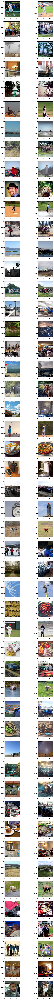

In [54]:
# x = torch.permute(all_images, (0,2,3,1))
# y = torch.permute(all_recons, (0,2,3,1))
# fig, ax = plt.subplots(len(test_image_indices), 2, figsize=(8, 100))
# for row, _ in enumerate(ax):
#     ax[row][0].imshow(x.cpu()[row])
#     ax[row][1].imshow(y.cpu()[row])
# plt.tight_layout()
# plt.show()

In [ ]:
# # --- Start of Snippet 1 ---

# # Let's test with a small batch of 4 images for a quick check.
# debug_batch_size = 4
# ground_truth_images = test_images[:debug_batch_size].to(device)

# # Generate the "perfect" CLIP embeddings directly from the images
# with torch.no_grad():
#     # This is the ideal target embedding that the reconstruction pipeline should receive
#     ground_truth_clip_embeddings = clip_img_embedder(ground_truth_images)

# print("Shape of ground truth CLIP embeddings:", ground_truth_clip_embeddings.shape)

# # --- End of Snippet 1 ---

In [ ]:
# # --- Start of Snippet 2 (Corrected) ---

# reconstructions_from_gt = []
# print("Generating reconstructions from ground truth embeddings...")

# with torch.no_grad():
#     for i in tqdm(range(debug_batch_size)):
#         # Select the embedding for the current image
#         current_embedding = ground_truth_clip_embeddings[[i]]

#         # Call the function with positional arguments, matching your script's format
#         samples = utils.unclip_recon(
#             current_embedding,
#             diffusion_engine,
#             vector_suffix,
#             num_samples=1  # We only need one reconstruction per image for this test
#         )
#         reconstructions_from_gt.append(samples.cpu())

# # Combine the generated images into a single tensor
# reconstructions_from_gt = torch.cat(reconstructions_from_gt, dim=0)

# print("Shape of final reconstructed tensor:", reconstructions_from_gt.shape)

# # --- End of Snippet 2 (Corrected) ---

In [ ]:
# # --- Start of Snippet 3 ---

# fig, axes = plt.subplots(debug_batch_size, 2, figsize=(6, 2 * debug_batch_size))
# fig.suptitle("Debugging: Original vs. Reconstructed from GT CLIP", fontsize=16)

# for i in range(debug_batch_size):
#     # Plot Original Image
#     ax = axes[i, 0]
#     ax.imshow(utils.torch_to_Image(ground_truth_images[i]))
#     ax.set_title(f"Original Image {i+1}")
#     ax.axis('off')

#     # Plot Reconstructed Image
#     ax = axes[i, 1]
#     ax.imshow(utils.torch_to_Image(reconstructions_from_gt[i]))
#     ax.set_title(f"Reconstruction {i+1}")
#     ax.axis('off')

# plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.show()

# # --- End of Snippet 3 ---

In [53]:
# # --- Start of Snippet 1 ---

# # Let's use a larger batch for a more stable analysis
debug_batch_size = 62 
if len(test_images) < debug_batch_size:
    debug_batch_size = len(test_images) # Adjust if your test set is smaller

# Select the fMRI data and corresponding ground truth images for this batch
voxels_for_debug = test_voxels[:debug_batch_size].unsqueeze(1).to(device)
images_for_debug = test_images[:debug_batch_size].to(device)
model.to(device)

print("Generating predicted CLIP embeddings from fMRI data...")
with torch.no_grad():
    # Pass fMRI data through your trained model to get the predicted embeddings
    # This follows the exact path from your recon_inference script
    voxel_ridge = model.ridge(voxels_for_debug, 0)
    backbone, _, _ = model.backbone(voxel_ridge)
    
    # The output of the diffusion prior is what's fed to unCLIP
    predicted_clip_embeddings = model.diffusion_prior.p_sample_loop(
        backbone.shape, 
        text_cond = dict(text_embed = backbone), 
        cond_scale = 1., 
        timesteps = 20
    ).cpu()

print("Generating ground truth CLIP embeddings from images...")
with torch.no_grad():
    # Generate the "perfect" CLIP embeddings directly from the images
    ground_truth_clip_embeddings = clip_img_embedder(images_for_debug).cpu()

print("\nShapes of embeddings:")
print("Predicted:", predicted_clip_embeddings.shape)
print("Ground Truth:", ground_truth_clip_embeddings.shape)

# # --- End of Snippet 1 ---

Generating predicted CLIP embeddings from fMRI data...


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

Generating ground truth CLIP embeddings from images...

Shapes of embeddings:
Predicted: torch.Size([50, 256, 1664])
Ground Truth: torch.Size([50, 256, 1664])


In [54]:
# # --- Start of Snippet 2 ---

import torch.nn.functional as F

# Flatten the embeddings to compare them as single vectors per image
# Shape changes from (batch, seq_len, dim) to (batch, seq_len * dim)
predicted_flat = predicted_clip_embeddings.flatten(1)
ground_truth_flat = ground_truth_clip_embeddings.flatten(1)

# 1. Cosine Similarity (should be high, confirming your retrieval results)
cos_sim = F.cosine_similarity(predicted_flat, ground_truth_flat).mean()

# 2. Mean Squared Error (MSE)
mse = F.mse_loss(predicted_flat, ground_truth_flat)

print(f"--- Quantitative Analysis (for batch of {debug_batch_size}) ---")
print(f"Average Cosine Similarity: {cos_sim.item():.4f}")
print(f"Mean Squared Error (MSE):  {mse.item():.4f}")

# # --- End of Snippet 2 ---

--- Quantitative Analysis (for batch of 50) ---
Average Cosine Similarity: 0.3315
Mean Squared Error (MSE):  1.6763



Fitting PCA to visualize embedding spaces...


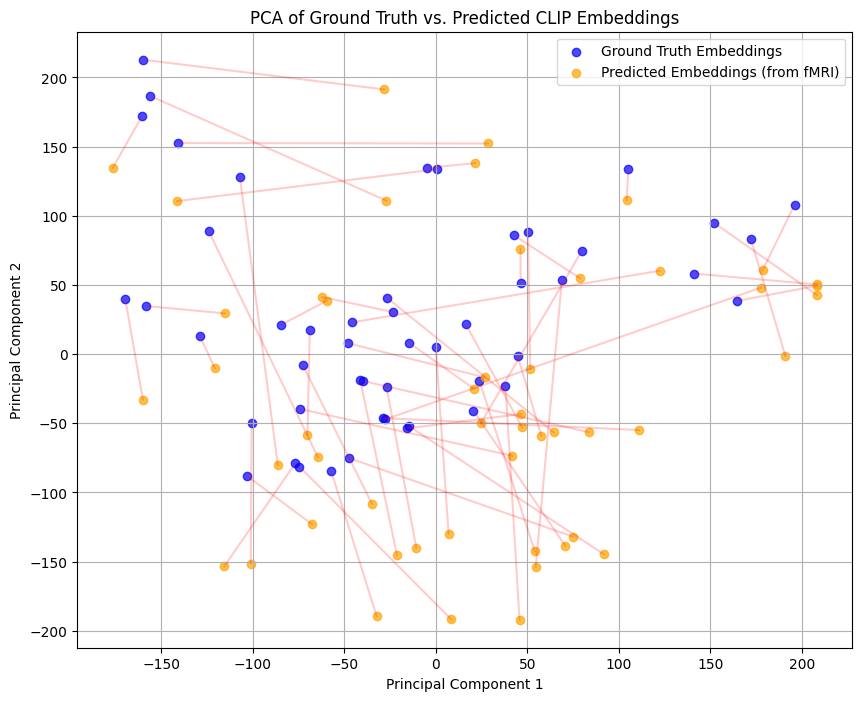

In [56]:
# # --- Start of Snippet 3 ---

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Combine both sets of embeddings for PCA
combined_embeddings = torch.cat((ground_truth_flat, predicted_flat), dim=0).numpy()
# np.random.seed(42)

print("\nFitting PCA to visualize embedding spaces...")
pca = PCA(n_components=2)
embeddings_2d = pca.fit_transform(combined_embeddings)

# Separate the transformed embeddings back into ground truth and predicted
gt_2d = embeddings_2d[:debug_batch_size]
pred_2d = embeddings_2d[debug_batch_size:]

# Create the plot
plt.figure(figsize=(10, 8))
plt.scatter(gt_2d[:, 0], gt_2d[:, 1], alpha=0.7, label='Ground Truth Embeddings', c='blue')
plt.scatter(pred_2d[:, 0], pred_2d[:, 1], alpha=0.7, label='Predicted Embeddings (from fMRI)', c='orange')

# Optional: Draw lines connecting corresponding points
for i in range(debug_batch_size):
    plt.plot([gt_2d[i, 0], pred_2d[i, 0]], [gt_2d[i, 1], pred_2d[i, 1]], 'r-', alpha=0.2)

plt.title('PCA of Ground Truth vs. Predicted CLIP Embeddings')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.grid(True)
plt.show()

# # --- End of Snippet 3 ---

In [61]:
# # --- Start of Snippet 1: Load Train Data ---

# # Make sure you are in the same directory or provide the correct path to your eval_dir
# # This file was saved during the training run
train_image_indices = np.load(f"{eval_dir}/train_image_indices.npy")
print(f"Loaded {len(train_image_indices)} training indices.")

# Let's select a random subset of the training data for a quick and representative analysis
debug_batch_size = 32
if len(train_image_indices) < debug_batch_size:
    debug_batch_size = len(train_image_indices)

# Select random indices from the training set
np.random.seed(42) # for reproducibility
random_train_indices = np.random.choice(train_image_indices, size=debug_batch_size, replace=False)

# Get the corresponding fMRI data and images
# Note: We are using the main `vox` and `images` tensors loaded in your inference notebook
vox_train, images_train = np.load(f"{eval_dir}/vox.npy"), np.load(f"{eval_dir}/images.npy")
vox_train, images_train = torch.from_numpy(vox_train), torch.from_numpy(images_train)
voxels_for_train_debug = vox_train[random_train_indices].unsqueeze(1).to(device)
images_for_train_debug = images_train[random_train_indices].to(device)

print("\nShapes for analysis:")
print("Train Voxels:", voxels_for_train_debug.shape)
print("Train Images:", images_for_train_debug.shape)

# # --- End of Snippet 1 ---

Loaded 481 training indices.

Shapes for analysis:
Train Voxels: torch.Size([32, 1, 2792])
Train Images: torch.Size([32, 3, 224, 224])


Generating predicted CLIP embeddings from training fMRI data...


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

Generating ground truth CLIP embeddings from training images...

--- Quantitative Analysis (for TRAIN batch of 32) ---
Average Cosine Similarity: 0.4573
Mean Squared Error (MSE):  1.3497
(For comparison, your test set MSE was ~1.73)

Fitting PCA for training set visualization...


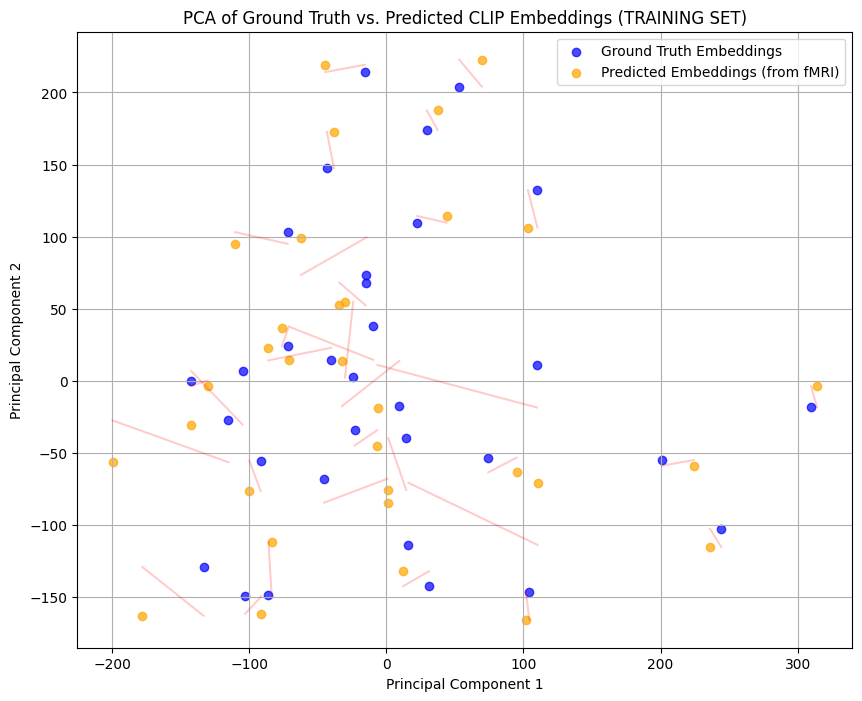

In [62]:
# # --- Start of Snippet 2: Analyze Train Embeddings ---

import torch.nn.functional as F
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Generate predicted embeddings from the model
print("Generating predicted CLIP embeddings from training fMRI data...")
with torch.no_grad():
    voxel_ridge_train = model.ridge(voxels_for_train_debug, 0)
    backbone_train, _, _ = model.backbone(voxel_ridge_train)
    predicted_clip_embeddings_train = model.diffusion_prior.p_sample_loop(
        backbone_train.shape, 
        text_cond=dict(text_embed=backbone_train), 
        cond_scale=1., 
        timesteps=20
    ).cpu()

# Generate ground truth embeddings from the images
print("Generating ground truth CLIP embeddings from training images...")
with torch.no_grad():
    ground_truth_clip_embeddings_train = clip_img_embedder(images_for_train_debug).cpu()

# --- Quantitative Analysis ---
predicted_flat_train = predicted_clip_embeddings_train.flatten(1)
ground_truth_flat_train = ground_truth_clip_embeddings_train.flatten(1)
cos_sim_train = F.cosine_similarity(predicted_flat_train, ground_truth_flat_train).mean()
mse_train = F.mse_loss(predicted_flat_train, ground_truth_flat_train)

print(f"\n--- Quantitative Analysis (for TRAIN batch of {debug_batch_size}) ---")
print(f"Average Cosine Similarity: {cos_sim_train.item():.4f}")
print(f"Mean Squared Error (MSE):  {mse_train.item():.4f}")
print(f"(For comparison, your test set MSE was ~1.73)")

# --- PCA Visualization ---
combined_embeddings_train = torch.cat((ground_truth_flat_train, predicted_flat_train), dim=0).numpy()
print("\nFitting PCA for training set visualization...")
pca_train = PCA(n_components=2)
embeddings_2d_train = pca_train.fit_transform(combined_embeddings_train)
gt_2d_train = embeddings_2d_train[:debug_batch_size]
pred_2d_train = embeddings_2d_train[debug_batch_size:]

plt.figure(figsize=(10, 8))
plt.scatter(gt_2d_train[:, 0], gt_2d_train[:, 1], alpha=0.7, label='Ground Truth Embeddings', c='blue')
plt.scatter(pred_2d_train[:, 0], pred_2d_train[:, 1], alpha=0.7, label='Predicted Embeddings (from fMRI)', c='orange')
for i in range(debug_batch_size):
    plt.plot([gt_2d_train[i, 0], pred_2d_train[i, 0]], [pred_2d_train[i, 1], gt_2d_train[i, 1]], 'r-', alpha=0.2)
plt.title('PCA of Ground Truth vs. Predicted CLIP Embeddings (TRAINING SET)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.grid(True)
plt.show()

# # --- End of Snippet 2 ---


Generating reconstructions from predicted training embeddings...


  0%|                                                                                                                                                                       | 0/32 [00:00<?, ?it/s]/scratch/am10150/projects/rtcloud-projects/mindeye/conf/.venv/lib64/python3.11/site-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/scratch/am10150/projects/rtcloud-projects/mindeye/conf/.venv/lib64/python3.11/site-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(
100%|████████████████████████████████████████████████████████████████████████

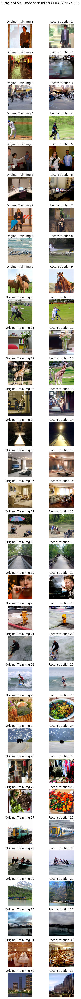

In [63]:
# # --- Start of Snippet 3: Reconstruct Train Images ---

reconstructions_from_train = []
print("\nGenerating reconstructions from predicted training embeddings...")

with torch.no_grad():
    for i in tqdm(range(debug_batch_size)):
        current_pred_embedding = predicted_clip_embeddings_train[[i]]
        
        samples = utils.unclip_recon(
            current_pred_embedding,
            diffusion_engine,
            vector_suffix,
            num_samples=1
        )
        reconstructions_from_train.append(samples.cpu())

reconstructions_from_train = torch.cat(reconstructions_from_train, dim=0)

# --- Visualization ---
fig, axes = plt.subplots(debug_batch_size, 2, figsize=(6, 2 * debug_batch_size))
fig.suptitle("Original vs. Reconstructed (TRAINING SET)", fontsize=16)

for i in range(debug_batch_size):
    # Plot Original Image
    ax = axes[i, 0]
    ax.imshow(utils.torch_to_Image(images_for_train_debug[i]))
    ax.set_title(f"Original Train Img {i+1}")
    ax.axis('off')

    # Plot Reconstructed Image
    ax = axes[i, 1]
    ax.imshow(utils.torch_to_Image(reconstructions_from_train[i]))
    ax.set_title(f"Reconstruction {i+1}")
    ax.axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

# # --- End of Snippet 3 ---


In [ ]:
# import numpy as np
# from sklearn.decomposition import PCA
# from sklearn.model_selection import train_test_split
# from sklearn.metrics.pairwise import cosine_similarity
# import matplotlib.pyplot as plt
# import seaborn as sns

# # --- Setup: Prepare Data for PCA ---

# # Convert the PyTorch tensors from your previous step to NumPy arrays
# predicted_np = predicted_clip_embeddings.cpu().numpy()
# ground_truth_np = ground_truth_clip_embeddings.cpu().numpy()

# # --- NEW STEP: Flatten the Embeddings ---
# # PCA requires a 2D array (samples, features). We will flatten the last two
# # dimensions (256, 1664) into a single feature vector for each sample.
# print("Original 3D shape:", predicted_np.shape)
# n_samples = predicted_np.shape[0]
# predicted_flat = predicted_np.reshape(n_samples, -1)
# ground_truth_flat = ground_truth_np.reshape(n_samples, -1)
# print("Flattened 2D shape:", predicted_flat.shape)


# # Create corresponding train and test splits for both sets of FLATTENED embeddings.
# pred_train, pred_test, true_train, true_test = train_test_split(
#     predicted_flat, # Use the flattened arrays
#     ground_truth_flat, # Use the flattened arrays
#     test_size=0.3, 
#     random_state=42
# )

# print(f"\n--- Data Split Shapes ---")
# print(f"Prediction Train Shape: {pred_train.shape}")
# print(f"Prediction Test Shape:  {pred_test.shape}")
# print(f"Ground Truth Train Shape: {true_train.shape}")
# print(f"Ground Truth Test Shape:  {true_test.shape}")


# # --- Task 1: Fit PCA Separately and Compare Principal Components ---

# print("\n--- Task 1: Comparing PCA Structures (Predicted vs. Ground Truth) ---")

# # We will analyze the top 10 principal components
# n_components = 10

# # Initialize separate PCA models for predicted and ground truth embeddings
# pca_predicted = PCA(n_components=n_components)
# pca_true = PCA(n_components=n_components)

# # Fit each PCA model on its respective TRAINING data
# # This will now work because pred_train and true_train are 2D
# pca_predicted.fit(pred_train)
# pca_true.fit(true_train)

# # Extract the principal component vectors (directions of max variance)
# predicted_components = pca_predicted.components_
# true_components = pca_true.components_

# print("\nCosine Similarity between Predicted and Ground Truth Principal Components:")
# # Compare the corresponding components from each model
# for i in range(n_components):
#     # Reshape each component vector for the cosine_similarity function
#     comp_pred = predicted_components[i, :].reshape(1, -1)
#     comp_true = true_components[i, :].reshape(1, -1)
    
#     sim = cosine_similarity(comp_pred, comp_true)[0, 0]
    
#     print(f"  - PC {i+1}: {sim:.4f}")


# # --- Task 2: Fit on Ground Truth, Project Both, and Plot Distributions ---

# print("\n--- Task 2: Plotting Projected Distributions on the Same Axes ---")

# # We will use the 'pca_true' object that was already fitted on the ground truth training data.
# # This PCA defines the "ideal" latent space.

# # Transform (project) both the predicted and ground truth TEST sets into this space
# pred_test_transformed = pca_true.transform(pred_test)
# true_test_transformed = pca_true.transform(true_test)

# print(f"\nShape of transformed predicted test data: {pred_test_transformed.shape}")
# print(f"Shape of transformed ground truth test data: {true_test_transformed.shape}")

# # Plot the distributions for the first few principal components to check for overlap
# num_components_to_plot = 4
# fig, axes = plt.subplots(num_components_to_plot, 1, figsize=(12, 10))
# fig.suptitle('Distribution of Predicted vs. True Embeddings\n(Projected onto Ground Truth PCA Space)', fontsize=16)

# for i in range(num_components_to_plot):
#     ax = axes[i]
#     # Plot kernel density estimates for a smooth visualization of the distributions
#     sns.kdeplot(true_test_transformed[:, i], ax=ax, label='Ground Truth', color='blue', fill=True, alpha=0.3)
#     sns.kdeplot(pred_test_transformed[:, i], ax=ax, label='Predicted', color='orange', fill=True, alpha=0.3)
    
#     ax.set_title(f'Principal Component {i+1}')
#     ax.set_xlabel('Projected Value')
#     ax.set_ylabel('Density')
#     ax.legend()

# plt.tight_layout(rect=[0, 0, 1, 0.95])
# plt.show()

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np

# # --- Visualize PCA Projections with a Scatterplot ---

# print("\n--- Generating PCA Scatterplot (PC1 vs PC2) ---")

# # We will plot the first two principal components
# pc1_index = 0
# pc2_index = 1

# # Extract the PC values for the ground truth test set
# true_pc1 = true_test_transformed[:, pc1_index]
# true_pc2 = true_test_transformed[:, pc2_index]

# # Extract the PC values for the predicted test set
# pred_pc1 = pred_test_transformed[:, pc1_index]
# pred_pc2 = pred_test_transformed[:, pc2_index]

# plt.figure(figsize=(10, 10))

# # Plot the ground truth points
# plt.scatter(true_pc1, true_pc2, c='blue', label='Ground Truth', alpha=0.7, s=50)

# # Plot the predicted points
# plt.scatter(pred_pc1, pred_pc2, c='orange', label='Predicted', alpha=0.7, s=50)

# # Draw lines connecting each predicted point to its ground truth counterpart
# for i in range(len(true_pc1)):
#     plt.plot([true_pc1[i], pred_pc1[i]], [true_pc2[i], pred_pc2[i]], 'r-', alpha=0.3)

# # --- Set plot properties ---
# plt.title('PCA of Predicted vs. Ground Truth Embeddings (Test Set)', fontsize=16)
# plt.xlabel(f'Principal Component {pc1_index + 1}', fontsize=12)
# plt.ylabel(f'Principal Component {pc2_index + 1}', fontsize=12)
# plt.legend()
# plt.grid(True, linestyle='--', alpha=0.6)

# # This is the crucial step for correct visual interpretation
# # It ensures that the scaling on the X and Y axes is the same.
# # A distance of '1' on the x-axis will look the same as a distance of '1' on the y-axis.
# plt.axis('equal')

# plt.show()

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np

# # --- Verify Distribution Similarity: Train vs. Test Ground Truth ---

# print("\n--- Generating Scatterplot to Compare Train and Test Ground Truth Distributions ---")

# # The 'pca_true' object was already fit on the training data in the previous step.
# # Now, we use it to transform the training data itself to get its PCA coordinates.
# true_train_transformed = pca_true.transform(true_train)

# # The test data ('true_test_transformed') was already transformed using this PCA, so we can use it directly.

# # We will plot the first two principal components
# pc1_index = 0
# pc2_index = 1

# plt.figure(figsize=(12, 12))

# # Plot the transformed TRAINING ground truth points
# plt.scatter(
#     true_train_transformed[:, pc1_index], 
#     true_train_transformed[:, pc2_index], 
#     c='royalblue', 
#     label='Train Ground Truth', 
#     alpha=0.6,  # Use transparency to see density
#     s=50
# )

# # Plot the transformed TESTING ground truth points on the SAME plot
# plt.scatter(
#     true_test_transformed[:, pc1_index], 
#     true_test_transformed[:, pc2_index], 
#     c='darkorange', 
#     label='Test Ground Truth', 
#     alpha=0.8, 
#     s=60,
#     edgecolor='black', # Add an edge to make test points stand out
#     linewidth=0.5
# )

# # --- Set plot properties ---
# plt.title('Train vs. Test Ground Truth Embeddings in PCA Space', fontsize=16)
# plt.xlabel(f'Principal Component {pc1_index + 1}', fontsize=12)
# plt.ylabel(f'Principal Component {pc2_index + 1}', fontsize=12)
# plt.legend()
# plt.grid(True, linestyle='--', alpha=0.6)

# # Use equal scaling for an accurate visual representation of the space
# plt.axis('equal')

# plt.show()

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# from mpl_toolkits.mplot3d import Axes3D # Required for 3D plotting

# # --- Part 1: Analyze and Plot Explained Variance ---

# print("\n--- Part 1: Explained Variance Analysis ---")

# # The pca_true object was fitted on the training data in the previous steps.
# # We can access the variance explained by each of its components.
# explained_variance = pca_true.explained_variance_ratio_

# # Calculate cumulative variance
# cumulative_variance = np.cumsum(explained_variance)

# # Print the variance explained by the first 2 and 3 components
# variance_2_pcs = cumulative_variance[1] # Index 1 = sum of first two
# variance_3_pcs = cumulative_variance[2] # Index 2 = sum of first three

# print(f"Variance explained by PC1: {explained_variance[0]:.2%}")
# print(f"Variance explained by PC2: {explained_variance[1]:.2%}")
# print(f"Variance explained by PC3: {explained_variance[2]:.2%}")
# print("-" * 35)
# print(f"Cumulative variance explained by first 2 PCs: {variance_2_pcs:.2%}")
# print(f"Cumulative variance explained by first 3 PCs: {variance_3_pcs:.2%}")

# # Create the Scree Plot (Explained Variance Plot)
# plt.figure(figsize=(10, 6))
# component_numbers = np.arange(1, len(explained_variance) + 1)

# # Plot individual variance
# plt.bar(component_numbers, explained_variance, alpha=0.6, color='g', 
#         label='Individual Explained Variance')

# # Plot cumulative variance
# plt.plot(component_numbers, cumulative_variance, marker='o', linestyle='--', color='r', 
#          label='Cumulative Explained Variance')

# plt.title('Explained Variance by Principal Components', fontsize=16)
# plt.xlabel('Principal Component Number', fontsize=12)
# plt.ylabel('Explained Variance Ratio', fontsize=12)
# plt.xticks(component_numbers)
# plt.ylim(0, 1.1)
# plt.legend(loc='best')
# plt.grid(True, linestyle='--', alpha=0.5)
# plt.show()


# # --- Part 2: Plot Ground Truth Embeddings in 3D ---

# print("\n--- Part 2: Generating 3D Scatterplot (Train vs. Test) ---")

# # We need to transform the training data using the same PCA
# true_train_transformed = pca_true.transform(true_train)
# # The 'true_test_transformed' variable is already available from the previous step.

# # Create a 3D figure
# fig = plt.figure(figsize=(12, 12))
# ax = fig.add_subplot(111, projection='3d')

# # Scatter plot for the transformed TRAINING data
# ax.scatter(
#     true_train_transformed[:, 0], # PC 1
#     true_train_transformed[:, 1], # PC 2
#     true_train_transformed[:, 2], # PC 3
#     c='royalblue',
#     label='Train Ground Truth',
#     alpha=0.5,
#     s=50
# )

# # Scatter plot for the transformed TESTING data
# ax.scatter(
#     true_test_transformed[:, 0], # PC 1
#     true_test_transformed[:, 1], # PC 2
#     true_test_transformed[:, 2], # PC 3
#     c='darkorange',
#     label='Test Ground Truth',
#     alpha=0.9,
#     s=60,
#     edgecolor='black',
#     linewidth=0.5
# )

# # --- Set plot properties ---
# ax.set_title('Train vs. Test Ground Truth in 3D PCA Space', fontsize=16)
# ax.set_xlabel('Principal Component 1', fontsize=10)
# ax.set_ylabel('Principal Component 2', fontsize=10)
# ax.set_zlabel('Principal Component 3', fontsize=10)
# ax.legend()
# plt.show()

In [ ]:
# import numpy as np
# from sklearn.model_selection import cross_val_score
# from sklearn.linear_model import LogisticRegression
# from sklearn.preprocessing import StandardScaler
# from sklearn.pipeline import make_pipeline

# # Ensure you have your flattened ground truth embeddings: true_train, true_test

# print("--- Method 1: Classifier Two-Sample Test (C2ST) using Logistic Regression ---")

# # 1. Combine the datasets
# X_combined = np.vstack((true_train, true_test))

# # 2. Create labels (0 for train, 1 for test)
# y_train_labels = np.zeros(true_train.shape[0])
# y_test_labels = np.ones(true_test.shape[0])
# y_combined = np.hstack((y_train_labels, y_test_labels))

# # 3. Use Logistic Regression. It's good practice to scale data for this model.
# print("Training a classifier to distinguish train from test sets...")
# # Create a pipeline to scale data and then classify
# classifier_pipe = make_pipeline(StandardScaler(), LogisticRegression(solver='liblinear', random_state=42))

# # Use cross-validation for a robust estimate
# cv_scores = cross_val_score(classifier_pipe, X_combined, y_combined, cv=5, scoring='roc_auc')

# # 4. Report the result
# mean_auc = np.mean(cv_scores)
# std_auc = np.std(cv_scores)

# print(f"\nMean AUC Score: {mean_auc:.4f} (+/- {std_auc:.4f})")
# if mean_auc < 0.55:
#     print("Interpretation: Excellent. The classifier cannot distinguish between train and test sets (AUC is close to 0.5).")
#     print("This suggests NO significant dataset shift.")
# elif mean_auc < 0.7:
#     print("Interpretation: Minor shift detected. The classifier can distinguish the sets with low accuracy.")
#     print("This is likely acceptable, but worth noting.")
# else:
#     print("Interpretation: WARNING. A significant dataset shift is likely (AUC > 0.7).")
#     print("The train and test distributions are measurably different.")

In [47]:
# model = model.to(device)
# clip_img_embedder = clip_img_embedder.to(device)

--- Using a batch size of 32 for model inference ---

--- Running Model Inference in Batches---
1. Generating embeddings for the TRAINING set...


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 1/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 2/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 3/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 4/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 5/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 6/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 7/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 8/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 9/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 10/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 11/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 12/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 13/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 14/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 15/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 16/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 17/18


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed train batch 18/18
2. Generating embeddings for the TESTING set...


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed test batch 1/4


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed test batch 2/4


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed test batch 3/4


sampling loop time step:   0%|          | 0/19 [00:00<?, ?it/s]

   Processed test batch 4/4
   Inference complete.

--- Starting PCA Analysis and Visualization ---
1. Flattening 3D embedding data to 2D...
2. Fitting PCA on Ground Truth training data...
   PCA fitted. Explained variance by first 2 PCs: 2.40%
3. Transforming all four data splits into PCA space...
4. Generating the final plot...


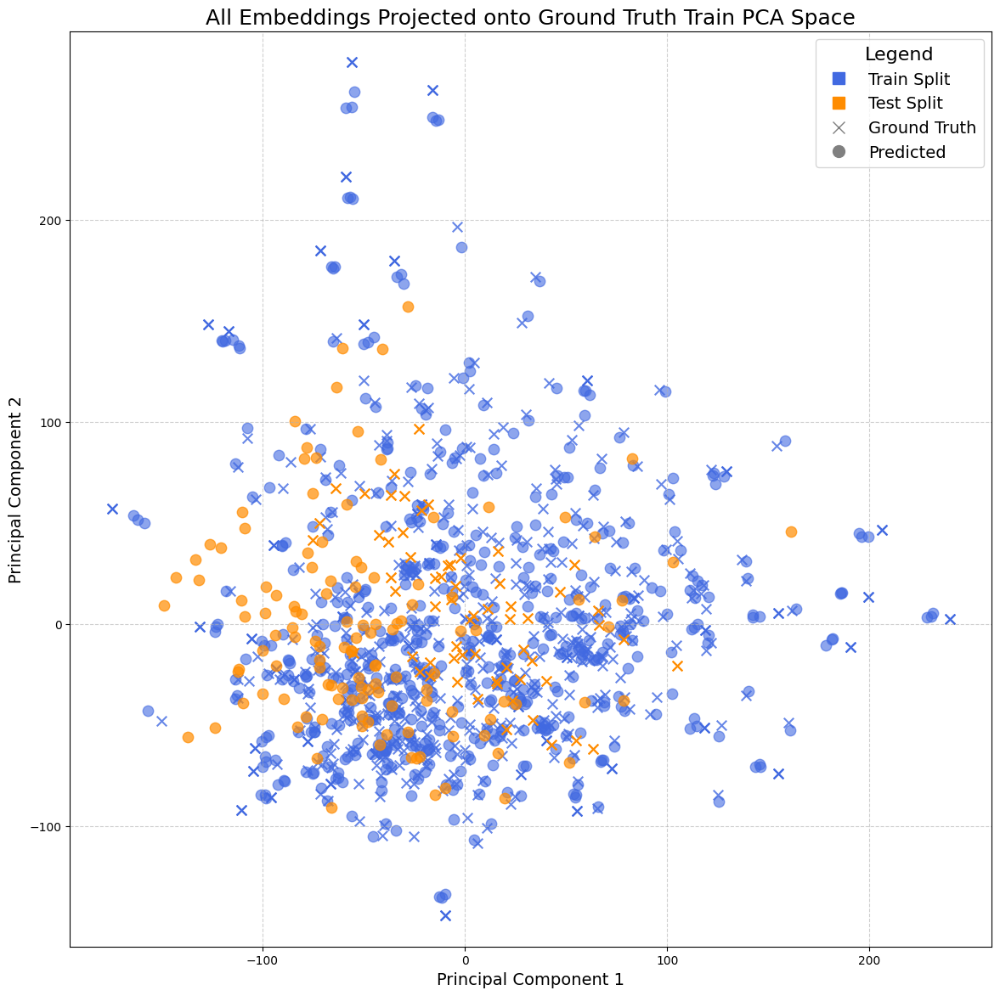


--- Standalone script finished. ---


In [48]:
# # === Part 1: All Necessary Imports ===
# import torch
# import numpy as np
# from sklearn.decomposition import PCA
# import matplotlib.pyplot as plt
# import matplotlib.lines as mlines

# # === Part 2: BATCH PROCESSING SETUP ===
# # Define a batch size that is small enough for your GPU's memory.
# # Powers of 2 are common. Start with 32 or 16 and adjust if needed.
# BATCH_SIZE = 32
# print(f"--- Using a batch size of {BATCH_SIZE} for model inference ---")

# # === Part 3: Model Inference with Batching ===
# print("\n--- Running Model Inference in Batches---")

# # Convert indices to tensors once
# train_indices_tensor = torch.from_numpy(train_image_indices).long()
# test_indices_tensor = torch.from_numpy(test_image_indices).long()

# # --- Process Training Data in Batches ---
# print("1. Generating embeddings for the TRAINING set...")
# # Lists to store the results from each batch
# pred_train_batches = []
# true_train_batches = []
# with torch.no_grad():
#     # Loop through the training indices in steps of BATCH_SIZE
#     for i in range(0, len(train_indices_tensor), BATCH_SIZE):
#         # Get the indices for the current batch
#         batch_indices = train_indices_tensor[i:i+BATCH_SIZE]
        
#         # Prepare only the data for THIS batch
#         voxels_batch = vox[batch_indices].unsqueeze(1).float().to(device)
#         images_batch = images[batch_indices].to(device)
        
#         # Run model inference on the batch
#         voxel_ridge_batch = model.ridge(voxels_batch, 0)
#         backbone_batch, _, _ = model.backbone(voxel_ridge_batch)
#         pred_batch = model.diffusion_prior.p_sample_loop(
#             backbone_batch.shape, text_cond=dict(text_embed=backbone_batch),
#             cond_scale=1., timesteps=20
#         ).cpu()
#         true_batch = clip_img_embedder(images_batch).cpu()
        
#         # Add the results to our lists
#         pred_train_batches.append(pred_batch)
#         true_train_batches.append(true_batch)
#         print(f"   Processed train batch {i//BATCH_SIZE + 1}/{len(train_indices_tensor)//BATCH_SIZE + 1}")

# # Concatenate all the batch results into single tensors
# predicted_clip_embeddings_train = torch.cat(pred_train_batches, dim=0)
# ground_truth_clip_embeddings_train = torch.cat(true_train_batches, dim=0)

# # --- Process Testing Data in Batches ---
# print("2. Generating embeddings for the TESTING set...")
# pred_test_batches = []
# true_test_batches = []
# with torch.no_grad():
#     for i in range(0, len(test_indices_tensor), BATCH_SIZE):
#         batch_indices = test_indices_tensor[i:i+BATCH_SIZE]
#         voxels_batch = vox[batch_indices].unsqueeze(1).float().to(device)
#         images_batch = images[batch_indices].to(device)
        
#         voxel_ridge_batch = model.ridge(voxels_batch, 0)
#         backbone_batch, _, _ = model.backbone(voxel_ridge_batch)
#         pred_batch = model.diffusion_prior.p_sample_loop(
#             backbone_batch.shape, text_cond=dict(text_embed=backbone_batch),
#             cond_scale=1., timesteps=20
#         ).cpu()
#         true_batch = clip_img_embedder(images_batch).cpu()
        
#         pred_test_batches.append(pred_batch)
#         true_test_batches.append(true_batch)
#         print(f"   Processed test batch {i//BATCH_SIZE + 1}/{len(test_indices_tensor)//BATCH_SIZE + 1}")

# predicted_clip_embeddings_test = torch.cat(pred_test_batches, dim=0)
# ground_truth_clip_embeddings_test = torch.cat(true_test_batches, dim=0)

# print("   Inference complete.")


# # === Part 4: PCA Analysis and Plotting (Unchanged) ===
# print("\n--- Starting PCA Analysis and Visualization ---")

# print("1. Flattening 3D embedding data to 2D...")
# true_train_flat = ground_truth_clip_embeddings_train.numpy().reshape(len(train_image_indices), -1)
# true_test_flat = ground_truth_clip_embeddings_test.numpy().reshape(len(test_image_indices), -1)
# pred_train_flat = predicted_clip_embeddings_train.numpy().reshape(len(train_image_indices), -1)
# pred_test_flat = predicted_clip_embeddings_test.numpy().reshape(len(test_image_indices), -1)

# print("2. Fitting PCA on Ground Truth training data...")
# pca_master = PCA(n_components=10)
# pca_master.fit(true_train_flat)
# print(f"   PCA fitted. Explained variance by first 2 PCs: {np.sum(pca_master.explained_variance_ratio_[:2]):.2%}")

# print("3. Transforming all four data splits into PCA space...")
# true_train_transformed = pca_master.transform(true_train_flat)
# true_test_transformed = pca_master.transform(true_test_flat)
# pred_train_transformed = pca_master.transform(pred_train_flat)
# pred_test_transformed = pca_master.transform(pred_test_flat)

# print("4. Generating the final plot...")
# plt.figure(figsize=(14, 14))
# plt.scatter(true_train_transformed[:, 0], true_train_transformed[:, 1], c='royalblue', marker='x', s=70, alpha=0.8)
# # plt.scatter(pred_train_transformed[:, 0], pred_train_transformed[:, 1], c='royalblue', marker='o', s=80, alpha=0.6)
# plt.scatter(true_test_transformed[:, 0], true_test_transformed[:, 1], c='darkorange', marker='x', s=70, alpha=0.9)
# plt.scatter(pred_test_transformed[:, 0], pred_test_transformed[:, 1], c='darkorange', marker='o', s=80, alpha=0.7)

# blue_patch = mlines.Line2D([], [], color='royalblue', marker='s', linestyle='None', markersize=10, label='Train Split')
# orange_patch = mlines.Line2D([], [], color='darkorange', marker='s', linestyle='None', markersize=10, label='Test Split')
# cross_marker = mlines.Line2D([], [], color='gray', marker='x', linestyle='None', markersize=10, label='Ground Truth')
# circle_marker = mlines.Line2D([], [], color='gray', marker='o', linestyle='None', markersize=10, label='Predicted')
# plt.legend(handles=[blue_patch, orange_patch, cross_marker, circle_marker], fontsize=14, title_fontsize=16, title='Legend')

# plt.title('All Embeddings Projected onto Ground Truth Train PCA Space', fontsize=18)
# plt.xlabel(f'Principal Component {1}', fontsize=14)
# plt.ylabel(f'Principal Component {2}', fontsize=14)
# plt.grid(True, linestyle='--', alpha=0.6)
# plt.axis('equal')

# plt.show()
# print("\n--- Standalone script finished. ---")

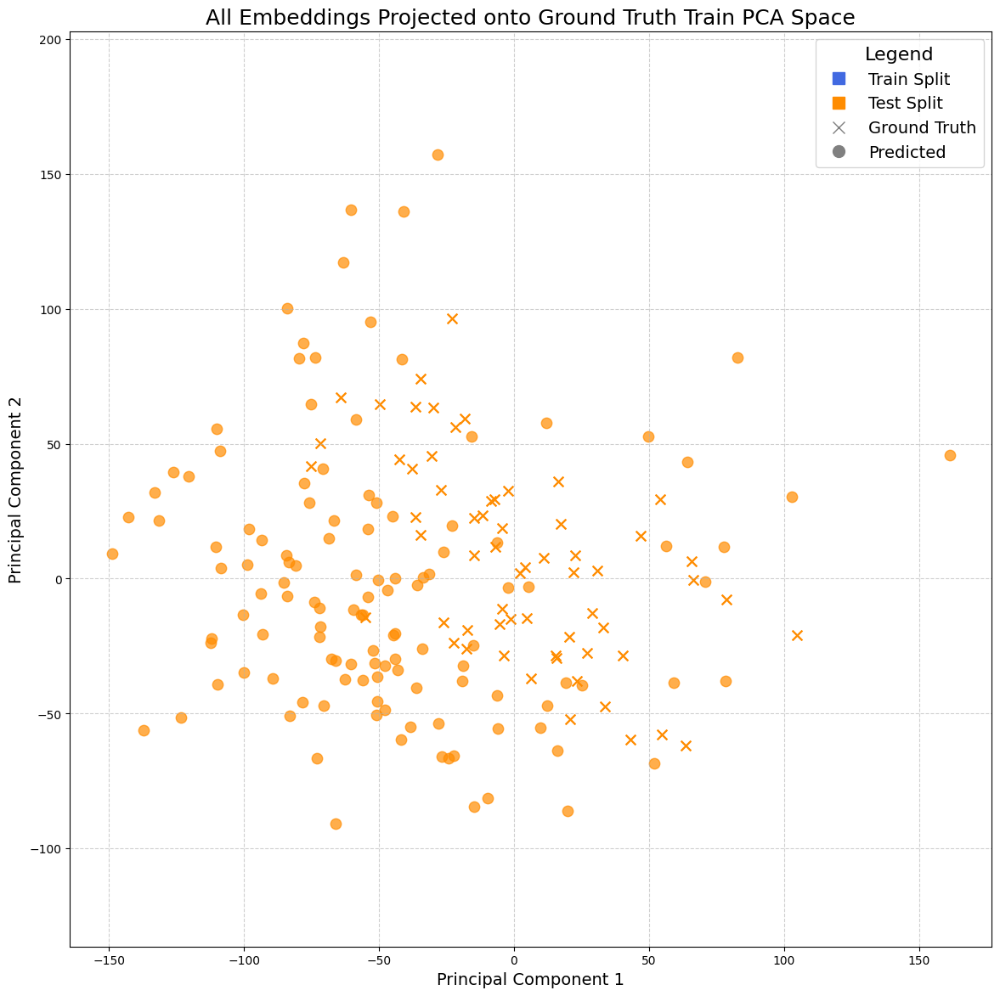

In [53]:
# plt.figure(figsize=(14, 14))
# # plt.scatter(true_train_transformed[:, 0], true_train_transformed[:, 1], c='royalblue', marker='x', s=70, alpha=0.8)
# # plt.scatter(pred_train_transformed[:, 0], pred_train_transformed[:, 1], c='royalblue', marker='o', s=80, alpha=0.6)
# plt.scatter(true_test_transformed[:, 0], true_test_transformed[:, 1], c='darkorange', marker='x', s=70, alpha=0.9)
# plt.scatter(pred_test_transformed[:, 0], pred_test_transformed[:, 1], c='darkorange', marker='o', s=80, alpha=0.7)

# blue_patch = mlines.Line2D([], [], color='royalblue', marker='s', linestyle='None', markersize=10, label='Train Split')
# orange_patch = mlines.Line2D([], [], color='darkorange', marker='s', linestyle='None', markersize=10, label='Test Split')
# cross_marker = mlines.Line2D([], [], color='gray', marker='x', linestyle='None', markersize=10, label='Ground Truth')
# circle_marker = mlines.Line2D([], [], color='gray', marker='o', linestyle='None', markersize=10, label='Predicted')
# plt.legend(handles=[blue_patch, orange_patch, cross_marker, circle_marker], fontsize=14, title_fontsize=16, title='Legend')

# plt.title('All Embeddings Projected onto Ground Truth Train PCA Space', fontsize=18)
# plt.xlabel(f'Principal Component {1}', fontsize=14)
# plt.ylabel(f'Principal Component {2}', fontsize=14)
# plt.grid(True, linestyle='--', alpha=0.6)
# plt.axis('equal')

# plt.show()

--- Generating separate plots for Train and Test set performance ---


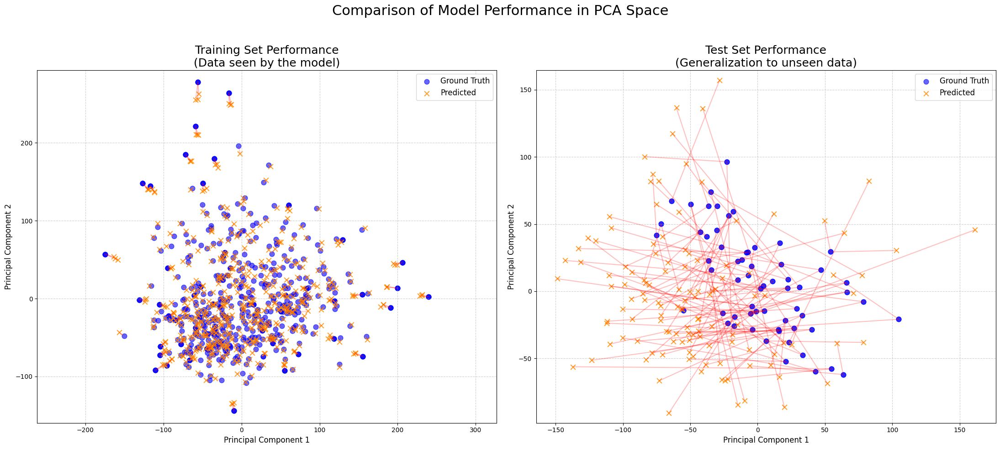

In [49]:
# import matplotlib.pyplot as plt
# import numpy as np

# # This script assumes the following variables exist from the previous cell:
# # - true_train_transformed
# # - pred_train_transformed
# # - true_test_transformed
# # - pred_test_transformed

# print("--- Generating separate plots for Train and Test set performance ---")

# # Create a figure with two subplots, one next to the other
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 10))

# # --- Plot 1: Training Set Performance ---
# ax1.set_title('Training Set Performance\n(Data seen by the model)', fontsize=18)
# # Plot ground truth points
# ax1.scatter(true_train_transformed[:, 0], true_train_transformed[:, 1], 
#             c='blue', label='Ground Truth', alpha=0.6, s=60)
# # Plot predicted points
# ax1.scatter(pred_train_transformed[:, 0], pred_train_transformed[:, 1], 
#             c='darkorange', label='Predicted', alpha=0.8, s=60, marker='x')

# # Draw lines connecting each ground truth point to its prediction to visualize error
# for i in range(len(true_train_transformed)):
#     ax1.plot([true_train_transformed[i, 0], pred_train_transformed[i, 0]], 
#              [true_train_transformed[i, 1], pred_train_transformed[i, 1]], 
#              'r-', alpha=0.2)

# ax1.set_xlabel('Principal Component 1', fontsize=12)
# ax1.set_ylabel('Principal Component 2', fontsize=12)
# ax1.grid(True, linestyle='--', alpha=0.6)
# ax1.axis('equal')
# ax1.legend(fontsize=12)


# # --- Plot 2: Test Set Performance (Generalization) ---
# ax2.set_title('Test Set Performance\n(Generalization to unseen data)', fontsize=18)
# # Plot ground truth points
# ax2.scatter(true_test_transformed[:, 0], true_test_transformed[:, 1], 
#             c='blue', label='Ground Truth', alpha=0.6, s=60)
# # Plot predicted points
# ax2.scatter(pred_test_transformed[:, 0], pred_test_transformed[:, 1], 
#             c='darkorange', label='Predicted', alpha=0.8, s=60, marker='x')

# # Draw lines connecting each ground truth point to its prediction
# for i in range(len(true_test_transformed)):
#     ax2.plot([true_test_transformed[i, 0], pred_test_transformed[i, 0]], 
#              [true_test_transformed[i, 1], pred_test_transformed[i, 1]], 
#              'r-', alpha=0.25)

# ax2.set_xlabel('Principal Component 1', fontsize=12)
# ax2.set_ylabel('Principal Component 2', fontsize=12)
# ax2.grid(True, linestyle='--', alpha=0.6)
# ax2.axis('equal')
# ax2.legend(fontsize=12)


# # Add a main title for the entire figure
# fig.suptitle('Comparison of Model Performance in PCA Space', fontsize=22)
# plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout to make room for suptitle
# plt.show()

In [ ]:
# import numpy as np
# print(f"Maximum index in train set: {np.max(train_image_indices)}")
# print(f"Maximum index in test set:  {np.max(test_image_indices)}")
# print(f"Size of vox tensor's first dimension: {vox.shape[0]}")

In [ ]:
# test_image_indices.shape

In [ ]:
# # --- Start of Snippet 1: Prepare Test Sets ---

# # These variables should already be loaded in your notebook from the initial setup
# # vox, images, MST_images, vox_image_names

# # --- Case 1: The AVERAGED Test Set ---
# # This uses the exact function from your training script.
# print("--- Preparing Case 1: Averaged Test Set ---")

# # Create the dictionary required by the function
# vox_image_dict = {k: v for k, v in enumerate(vox_image_names)}

# # Run the filtering and averaging function
# vox_avg, kept_indices_avg = utils.filter_and_average_mst(vox, vox_image_dict)

# # Create the corresponding images and MST mask for this new averaged dataset
# images_avg = images[kept_indices_avg]
# MST_images_filtered = MST_images[kept_indices_avg]

# # The test indices are where the MST mask is True in this new, smaller dataset
# test_image_indices_avg = np.where(MST_images_filtered == True)[0]

# print(f"Shape of averaged voxels: {vox_avg.shape}")
# print(f"Number of test images in averaged set: {len(test_image_indices_avg)}\n")


# # --- Case 2: The UNAVERAGED Test Set ---
# # This uses a simple boolean mask, treating all trials as unique.
# print("--- Preparing Case 2: Unaveraged Test Set ---")

# # The voxels and images are the original, full tensors
# vox_unavg = vox
# images_unavg = images

# # The test indices are simply where the original MST mask is True
# test_image_indices_unavg = np.where(MST_images == True)[0]

# print(f"Shape of unaveraged voxels: {vox_unavg.shape}")
# print(f"Number of test images in unaveraged set: {len(test_image_indices_unavg)}")
# print("(This will be higher than the averaged set due to repeats)\n")

# print("Successfully prepared both 'avg' and 'unavg' test sets using script-native logic.")
# # --- End of Snippet 1 ---

In [ ]:
# # --- Start of Snippet 1: Analysis Helper Function ---

# import torch.nn.functional as F

# def run_analysis_on_test_set(vox_data, image_indices, description=""):
#     """
#     Runs the full analysis pipeline (prediction, metrics, reconstruction) 
#     on a given set of fMRI data and corresponding image indices.
#     """
#     print(f"\n--- Running Analysis on: {description} Test Set ---")
    
#     # Ensure data is on the correct device
#     vox_data = vox_data.to(device)
    
#     with torch.no_grad():
#         # --- 1. Generate Predicted Embeddings from fMRI ---
#         # The input voxels need an extra dimension for the model's sequence length
#         if vox_data.dim() == 2:
#             vox_data = vox_data.unsqueeze(1)
            
#         voxel_ridge = model.ridge(vox_data, 0)
#         backbone, _, _ = model.backbone(voxel_ridge)
#         predicted_embeddings = model.diffusion_prior.p_sample_loop(
#             backbone.shape, 
#             text_cond=dict(text_embed=backbone), 
#             cond_scale=1., 
#             timesteps=20
#         ).cpu()

#         # --- 2. Get Ground Truth Images and Embeddings ---
#         original_images = images[image_indices].to(device)
#         ground_truth_embeddings = clip_img_embedder(original_images).cpu()

#         # --- 3. Calculate Quantitative Metrics ---
#         predicted_flat = predicted_embeddings.flatten(1)
#         ground_truth_flat = ground_truth_embeddings.flatten(1)
        
#         cos_sim = F.cosine_similarity(predicted_flat, ground_truth_flat).mean().item()
#         mse = F.mse_loss(predicted_flat, ground_truth_flat).item()
        
#         print(f"Results for {description}: Cosine Sim = {cos_sim:.4f}, MSE = {mse:.4f}")

#         # --- 4. Generate Reconstructions ---
#         reconstructions = utils.unclip_recon(
#             predicted_embeddings, 
#             diffusion_engine, 
#             vector_suffix, 
#             num_samples=1
#         ).cpu()

#     return {
#         "cos_sim": cos_sim,
#         "mse": mse,
#         "reconstructions": reconstructions,
#         "original_images": original_images.cpu() # Store original images for plotting
#     }

# # --- End of Snippet 1 ---

In [ ]:
# # --- Start of Snippet 2: Execute Analysis ---

# # Run on the baseline, unaveraged test set
# unavg_results = run_analysis_on_test_set(
#     vox_test_unavg, 
#     test_image_indices_unavg, 
#     "Unaveraged (Baseline)"
# )

# # Run on the experimental, averaged test set
# avg_results = run_analysis_on_test_set(
#     vox_test_avg, 
#     test_image_indices_avg, 
#     "Averaged (Experimental)"
# )

# # --- End of Snippet 2 ---

In [ ]:
# # --- Start of Snippet 3: Compare Results ---

# # --- 1. Quantitative Comparison Table ---
# print("\n\n--- Final Comparison of Embedding Quality ---")
# print(f"  METRIC       | UNAVERAGED |  AVERAGED  |  IMPROVEMENT")
# print(f"----------------------------------------------------------")
# cos_sim_imp = avg_results['cos_sim'] - unavg_results['cos_sim']
# mse_imp = avg_results['mse'] - unavg_results['mse']
# print(f"Cosine Sim     |  {unavg_results['cos_sim']:.4f}    |  {avg_results['cos_sim']:.4f}  |  {cos_sim_imp:+.4f}")
# print(f"MSE            |  {unavg_results['mse']:.4f}    |  {avg_results['mse']:.4f}  |  {mse_imp:+.4f}")
# print("----------------------------------------------------------")
# if mse_imp < 0:
#     print("✅ Averaging betas significantly improved embedding quality.")
# else:
#     print("❌ Averaging betas did not improve embedding quality.")


# # --- 2. Visual Comparison of Reconstructions ---
# num_examples_to_show = 4

# fig, axes = plt.subplots(num_examples_to_show, 3, figsize=(9, 3 * num_examples_to_show))
# fig.suptitle("Original vs. Unaveraged Recon vs. Averaged Recon", fontsize=16)

# for i in range(num_examples_to_show):
#     # Get the image and reconstruction from the AVERAGED results
#     original_img = avg_results['original_images'][i]
#     recon_avg = avg_results['reconstructions'][i]
    
#     # Now, find the corresponding UNAVERAGED reconstruction for the same image
#     # The image index from the averaged set will tell us which one to find
#     img_idx_to_find = test_image_indices_avg[i]
#     position_in_unavg_set = np.where(test_image_indices_unavg == img_idx_to_find)[0][0]
#     recon_unavg = unavg_results['reconstructions'][position_in_unavg_set]

#     # Plot Original Image
#     axes[i, 0].imshow(utils.torch_to_Image(original_img))
#     axes[i, 0].set_title("Original Image")
#     axes[i, 0].axis('off')

#     # Plot Reconstruction from a Single Beta (Unaveraged)
#     axes[i, 1].imshow(utils.torch_to_Image(recon_unavg))
#     axes[i, 1].set_title("Recon (Unaveraged)")
#     axes[i, 1].axis('off')

#     # Plot Reconstruction from the Averaged Beta
#     axes[i, 2].imshow(utils.torch_to_Image(recon_avg))
#     axes[i, 2].set_title("Recon (Averaged)")
#     axes[i, 2].axis('off')

# plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.show()

# # --- End of Snippet 3 ---

In [ ]:
# from copy import deepcopy
# original_vox = deepcopy(vox)
# original_images = deepcopy(images)
# print(f"Original images shape: {original_images.shape}")
# print(f"Original voxels shape: {original_vox.shape}\n")
# original_vox = utils.zscore(original_vox, train_mean=np.mean(original_vox[train_image_indices]), train_std=np.std(original_vox[train_image_indices]))

In [ ]:
# # --- Case 1: The AVERAGED Test Set (avg_over_repeats = True logic) ---
# print("--- Preparing Case 1: Averaged Test Set ---")
# vox_image_dict = {k: v for k, v in enumerate(vox_image_names)}
# vox_avg, kept_indices_avg = utils.filter_and_average_mst(original_vox, vox_image_dict)
# images_avg = original_images[kept_indices_avg]
# MST_images_filtered = MST_images[kept_indices_avg]
# test_image_indices_avg = np.where(MST_images_filtered == True)[0]

# print(f"Shape of averaged voxels: {vox_avg.shape}")
# print(f"Number of test images in averaged set: {len(test_image_indices_avg)}\n")


# # --- Case 2: The UNAVERAGED Test Set (avg_over_repeats = False logic) ---
# print("--- Preparing Case 2: Unaveraged Test Set ---")
# # For this case, the data is simply the original, full-size data
# vox_unavg = original_vox
# images_unavg = original_images
# test_image_indices_unavg = np.where(MST_images == True)[0]

# print(f"Shape of unaveraged voxels: {vox_unavg.shape}")
# print(f"Number of test images in unaveraged set: {len(test_image_indices_unavg)}\n")

# print("✅ Successfully prepared both 'avg' and 'unavg' test sets from a clean data source.")

# # --- End of Snippet 1 (Corrected) ---

In [ ]:
# # --- Start of Snippet 2: Reusable Analysis Function ---

# import torch.nn.functional as F

# def run_analysis_on_test_set(vox_data, images_data, test_indices, description=""):
#     """
#     Runs the full analysis pipeline on a given set of data.
#     """
#     print(f"\n--- Running Analysis on: {description} Test Set ---")
    
#     # Subset the data for the current test set
#     vox_for_test = vox_data[test_indices].to(device)
#     images_for_test = images_data[test_indices].to(device)
    
#     with torch.no_grad():
#         if vox_for_test.dim() == 2:
#             vox_for_test = vox_for_test.unsqueeze(1)
            
#         voxel_ridge = model.ridge(vox_for_test, 0)
#         backbone, _, _ = model.backbone(voxel_ridge)
#         predicted_embeddings = model.diffusion_prior.p_sample_loop(
#             backbone.shape, text_cond=dict(text_embed=backbone), cond_scale=1., timesteps=20
#         ).cpu()

#         ground_truth_embeddings = clip_img_embedder(images_for_test).cpu()

#         predicted_flat = predicted_embeddings.flatten(1)
#         ground_truth_flat = ground_truth_embeddings.flatten(1)
        
#         cos_sim = F.cosine_similarity(predicted_flat, ground_truth_flat).mean().item()
#         mse = F.mse_loss(predicted_flat, ground_truth_flat).item()
        
#         print(f"Results for {description}: Cosine Sim = {cos_sim:.4f}, MSE = {mse:.4f}")

#         reconstructions = utils.unclip_recon(
#             predicted_embeddings, diffusion_engine, vector_suffix, num_samples=1
#         ).cpu()

#     return {
#         "cos_sim": cos_sim,
#         "mse": mse,
#         "reconstructions": reconstructions,
#         "original_images": images_for_test.cpu()
#     }
# # --- End of Snippet 2 ---

In [ ]:
# avg_results['reconstructions'].shape

In [ ]:
# # --- Start of Snippet 3: Execute and Compare ---

# # Run on the experimental, averaged test set
# avg_results = run_analysis_on_test_set(
#     torch.Tensor(vox_avg),
#     images_avg,
#     test_image_indices_avg,
#     "Averaged"
# )

# # Run on the baseline, unaveraged test set
# unavg_results = run_analysis_on_test_set(
#     torch.Tensor(vox_unavg),
#     images_unavg,
#     test_image_indices_unavg,
#     "Unaveraged (Baseline)"
# )

# # --- Quantitative Comparison Table ---
# print("\n\n--- Final Comparison of Embedding Quality ---")
# print(f"  METRIC       | UNAVERAGED |  AVERAGED  |  IMPROVEMENT")
# print(f"----------------------------------------------------------")
# cos_sim_imp = avg_results['cos_sim'] - unavg_results['cos_sim']
# mse_imp = avg_results['mse'] - unavg_results['mse']
# print(f"Cosine Sim     |  {unavg_results['cos_sim']:.4f}    |  {avg_results['cos_sim']:.4f}  |  {cos_sim_imp:+.4f}")
# print(f"MSE            |  {unavg_results['mse']:.4f}    |  {avg_results['mse']:.4f}  |  {mse_imp:+.4f}")
# print("----------------------------------------------------------")
# if mse_imp < 0:
#     print("✅ Averaging betas significantly improved embedding quality and generalization.")
# else:
#     print("❌ Averaging betas did not improve embedding quality.")


# # --- Visual Comparison of Reconstructions ---
# # We need to carefully match images between the two result sets
# num_examples_to_show = 4

# # Create a mapping from original image index to its position in the unaveraged results
# unavg_pos_map = {original_idx: pos for pos, original_idx in enumerate(test_image_indices_unavg)}

# fig, axes = plt.subplots(num_examples_to_show, 3, figsize=(9, 3 * num_examples_to_show))
# fig.suptitle("Original vs. Unaveraged Recon vs. Averaged Recon", fontsize=16)

# for i in range(num_examples_to_show):
#     # Get the image and reconstruction from the AVERAGED results
#     original_img = avg_results['original_images'][i]
#     recon_avg = avg_results['reconstructions'][i]
    
#     # Find the original index of this image before averaging
#     original_idx_of_avg_img = kept_indices_avg[test_image_indices_avg[i]]
    
#     # Use the map to find the position of this image in the UNAVERAGED results
#     # We take the first instance found, as there might be repeats
#     pos_in_unavg_set = unavg_pos_map.get(original_idx_of_avg_img)
#     if pos_in_unavg_set is not None:
#         recon_unavg = unavg_results['reconstructions'][pos_in_unavg_set]
#     else:
#         # Fallback in case of a mismatch, should not happen
#         recon_unavg = torch.zeros_like(recon_avg) 

#     # Plot Original Image
#     axes[i, 0].imshow(utils.torch_to_Image(original_img))
#     axes[i, 0].set_title("Original Image")
#     axes[i, 0].axis('off')

#     # Plot Reconstruction from a Single Beta (Unaveraged)
#     axes[i, 1].imshow(utils.torch_to_Image(recon_unavg))
#     axes[i, 1].set_title("Recon (Unaveraged)")
#     axes[i, 1].axis('off')

#     # Plot Reconstruction from the Averaged Beta
#     axes[i, 2].imshow(utils.torch_to_Image(recon_avg))
#     axes[i, 2].set_title("Recon (Averaged)")
#     axes[i, 2].axis('off')

# plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.show()

# # --- End of Snippet 3 ---